In [2]:
import pandas as pd
import numpy as np 
import re
from sklearn.preprocessing import StandardScaler
import rpy2.robjects as robjects

In [3]:
%load_ext rpy2.ipython

In [4]:
abbrev = pd.read_csv("abbrev.csv")
abbrev.head()

,Unnamed: 0,household_size,empl_agriculture,empl_professional,empl_social,empl_services,empl_manufacturing,empl_retail,empl_transp_utilities,prc_fam_poverty,...,deaths_april1,deaths,cases_march24,cases_april1,cases_april23,ten_plus,order,density,death_prc,uninsured
0,0,2.56,1.079230,11.181199,19.409400,8.323099,22.213539,10.247107,5.654795,9.9,...,0,0.000001,0,19,50,26,20,205.559775,8.397081e-12,1.185668
1,1,3.15,14.810805,7.410151,21.601702,8.941190,7.127118,9.305904,4.424056,15.6,...,0,1.000000,0,4,35,11,36,108.941861,6.606503e-06,9.905791
2,2,3.31,15.989974,10.084580,19.673111,10.873224,6.512608,8.971354,3.888164,10.5,...,1,4.000000,14,42,154,33,36,132.778760,9.182863e-06,3.714698
3,3,2.37,1.339175,16.368947,20.669588,11.533536,3.509718,10.598809,6.790248,5.1,...,0,1.000000,2,26,36,26,36,104.091797,1.003049e-05,1.227732
4,4,2.59,1.066778,9.394248,25.461959,11.484731,4.417867,12.854456,5.007969,9.5,...,1,3.000000,2,7,28,20,36,47.687662,1.666296e-05,0.826483


In [5]:
abbrev = abbrev.drop('Unnamed: 0', axis=1)
abbrev.columns.values

array(['household_size', 'empl_agriculture', 'empl_professional',
       'empl_social', 'empl_services', 'empl_manufacturing',
       'empl_retail', 'empl_transp_utilities', 'prc_fam_poverty',
       'avg_income', 'prc_public_transp', 'population', 'pop_65_plus',
       'county', 'state', 'FIPS', 'area', 'prc_obese', 'incarcerated',
       'domestic_passengers', 'intl_passengers', 'deaths_march24',
       'deaths_april1', 'deaths', 'cases_march24', 'cases_april1',
       'cases_april23', 'ten_plus', 'order', 'density', 'death_prc',
       'uninsured'], dtype=object)

In [6]:
predictors = ['household_size', 'empl_agriculture', 'empl_professional','empl_social', 'empl_services', 
              'empl_manufacturing', 'empl_retail', 'empl_transp_utilities', 'prc_fam_poverty',
              'avg_income', 'prc_public_transp', 'population', 'pop_65_plus', 'uninsured', 'area', 
              'incarcerated', 'domestic_passengers', 'intl_passengers', 'prc_obese', 'ten_plus', 
              'order', 'density', 'cases_march24']
# omitting april case data, since it's pretty much perfectly correlated with deaths

predictors_noCaseData = predictors.copy()
predictors_noCaseData.remove('cases_march24')

transform = ["population", "density", "intl_passengers", "domestic_passengers", "area", 
            "cases_march24", "incarcerated", "empl_agriculture", "prc_public_transp"]

for field in transform:
    abbrev.loc[abbrev[field] == 0, field] = 0.0000001
    abbrev["log_"+field] = np.log1p(abbrev[field])
    
log_predictors = predictors.copy()
for field in transform:
    log_predictors.remove(field)
    log_predictors.append("log_"+field)
    
log_predictors_noCaseData = log_predictors.copy()
log_predictors_noCaseData.remove('log_cases_march24')

In [7]:
indp_vars = [predictors_noCaseData, predictors, 
             log_predictors_noCaseData, log_predictors]
labels = ["no case data", "with case data", 
          "with transformed predictors, no case data", 
          "with transformed predictors, with case data"]

In [8]:
abbrev["log_deaths"] = np.log1p(abbrev["deaths"])

In [9]:
# apply standard scaling to predictors

original = abbrev.copy()
all_predictors = set()
for x in indp_vars:
    all_predictors = all_predictors.union(x)
    
all_predictors = list(all_predictors)
scaler = StandardScaler()
scaler.fit(abbrev[all_predictors])
abbrev[all_predictors] = scaler.transform(abbrev[all_predictors])

abbrev[all_predictors].describe()

,log_intl_passengers,log_density,prc_obese,pop_65_plus,prc_fam_poverty,intl_passengers,ten_plus,log_area,empl_social,domestic_passengers,...,log_incarcerated,log_empl_agriculture,log_domestic_passengers,population,empl_retail,log_cases_march24,cases_march24,log_population,incarcerated,density
count,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,...,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02
mean,1.052497e-16,7.691013e-16,2.213734e-16,1.733465e-16,1.346162e-16,3.503848e-16,-1.586464e-16,1.860798e-15,-9.090203e-17,-9.591951e-17,...,5.040976e-16,1.005510e-16,4.430152e-18,-3.208504e-17,-2.178494e-16,1.389457e-16,-4.735564e-17,-9.645367e-16,4.081949e-17,1.612643e-17
std,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,...,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00
min,-5.099840e-01,-3.258172e+00,-3.177501e+00,-2.110942e+00,-1.820517e+00,-2.566046e-01,-3.287063e+00,-4.219290e+00,-5.030994e+00,-4.539130e-01,...,-3.802689e+00,-1.470589e+00,-1.141028e+00,-4.640806e-01,-5.711034e+00,-1.323476e+00,-1.696622e-01,-1.270937e+00,-6.130193e-01,-2.498650e-01
25%,-5.099840e-01,-6.080646e-01,-6.437849e-01,-6.369323e-01,-7.373239e-01,-2.566046e-01,-5.510562e-01,-4.776505e-01,-6.320650e-01,-4.539130e-01,...,-3.039255e-01,-7.306919e-01,-1.141028e+00,-4.073826e-01,-6.170632e-01,-6.191891e-01,-1.634779e-01,-7.966149e-01,-4.260728e-01,-2.096455e-01
50%,-5.099840e-01,-7.606530e-02,8.147965e-02,-9.638015e-02,-1.486322e-01,-2.566046e-01,4.372777e-02,-5.955891e-02,-1.444403e-01,-4.217655e-01,...,8.582683e-02,-2.452055e-01,5.819784e-01,-2.988431e-01,-4.956333e-02,-1.748333e-01,-1.542013e-01,-2.306876e-01,-2.728744e-01,-1.708331e-01
75%,-5.099840e-01,5.206932e-01,6.937159e-01,4.452745e-01,5.577978e-01,-2.566046e-01,6.385118e-01,3.582797e-01,5.215196e-01,-2.177694e-01,...,5.184642e-01,5.674362e-01,8.545602e-01,6.448881e-03,5.508205e-01,5.641148e-01,-1.140030e-01,6.043379e-01,4.728821e-02,-8.304943e-02
max,2.454217e+00,4.433106e+00,3.133242e+00,9.470146e+00,4.796378e+00,8.051965e+00,2.898691e+00,4.093245e+00,4.696597e+00,4.477269e+00,...,2.576654e+00,4.155522e+00,1.269958e+00,1.655084e+01,4.843879e+00,4.145173e+00,1.549531e+01,4.360334e+00,1.481073e+01,2.082053e+01


## Functions for Modelling, Analyzing

In [9]:
def get_predictor_combo(pred_set):
    pred_formula = ""
    ind_vars = list()
    for col in pred_set:
        if col != "deaths" and col != "log_deaths":
            ind_vars.append(col)
    return " + ".join(ind_vars)

def get_linear_formula(pred_set, dep_var_name):
    pred_formula = get_predictor_combo(pred_set)
    form = dep_var_name + " ~ " + pred_formula
    return re.sub(" +", " ", form)

def get_var_names_from_formula(formula):
    indp = re.sub("^.+ ~ ", "", formula)
    return indp.split(" + ")

## Linear Regression

In [10]:
formulas = list()
for var_set in indp_vars:
    formulas.append(get_linear_formula(var_set, "deaths"))
log_formulas = list()
for var_set in indp_vars:
    log_formulas.append(get_linear_formula(var_set, "log_deaths"))

In [11]:
formulas[0]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

/home/anna/anaconda3/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:63: UserWarning: Error while trying to convert the column "county". Fall back to string conversion. The error is: module 'pandas' has no attribute 'NA'
  % (name, str(e)))
/home/anna/anaconda3/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:63: UserWarning: Error while trying to convert the column "state". Fall back to string conversion. The error is: module 'pandas' has no attribute 'NA'
  % (name, str(e)))



Call:
glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + 
    population + pop_65_plus + uninsured + area + incarcerated + 
    domestic_passengers + intl_passengers + prc_obese + ten_plus + 
    order + density, family = gaussian, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-728.48   -32.28    -5.93    27.00  1122.85  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)             50.0544     3.7801  13.242  < 2e-16 ***
household_size           4.6764     5.2159   0.897 0.370219    
empl_agriculture        -4.0660     4.7817  -0.850 0.395399    
empl_professional      -18.8391     7.4165  -2.540 0.011267 *  
empl_social             -1.2931     5.2929  -0.244 0.807047    
empl_services           -1.1073     4.6786  -0.237 0.812972  

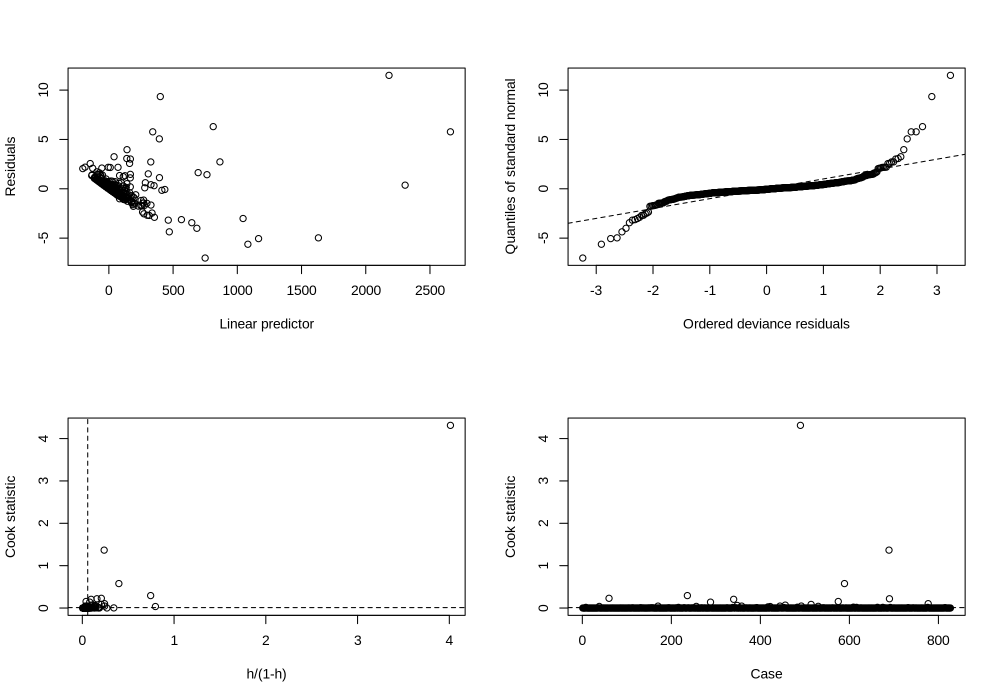

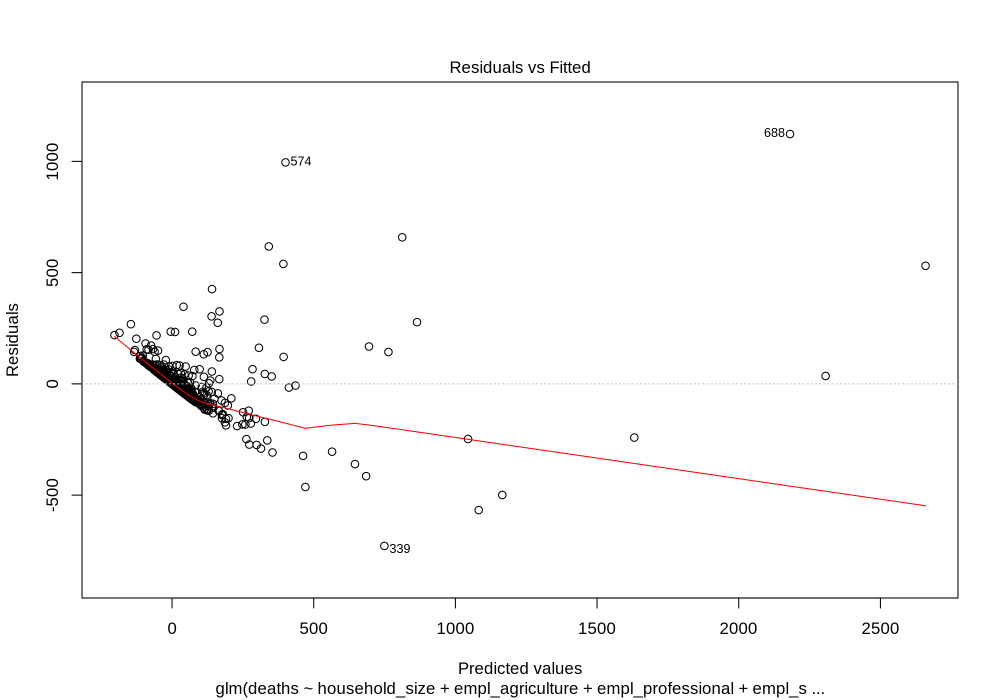

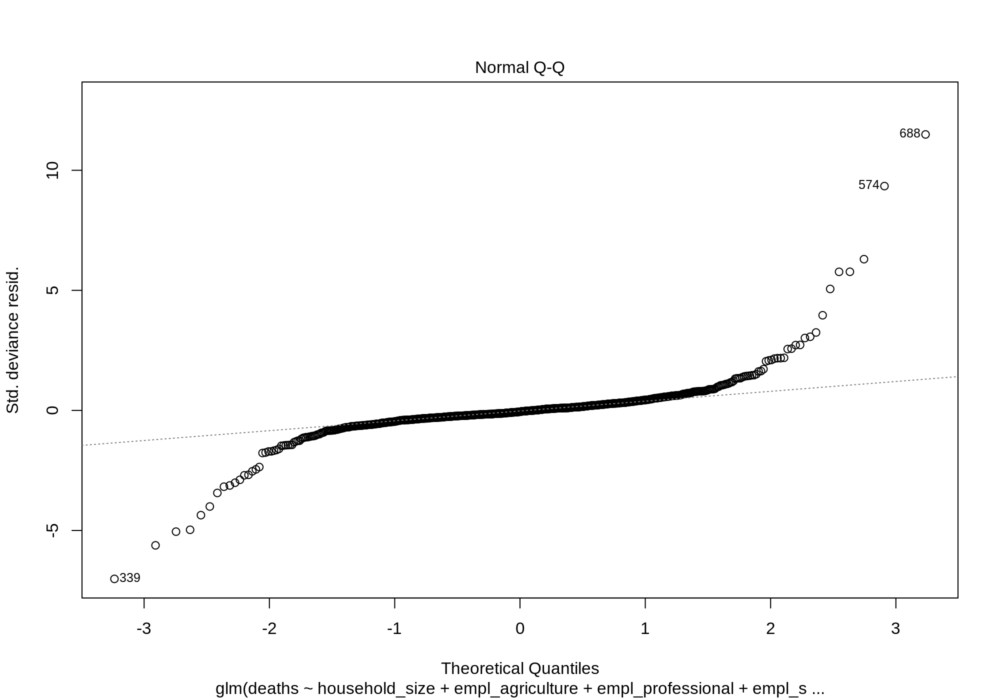

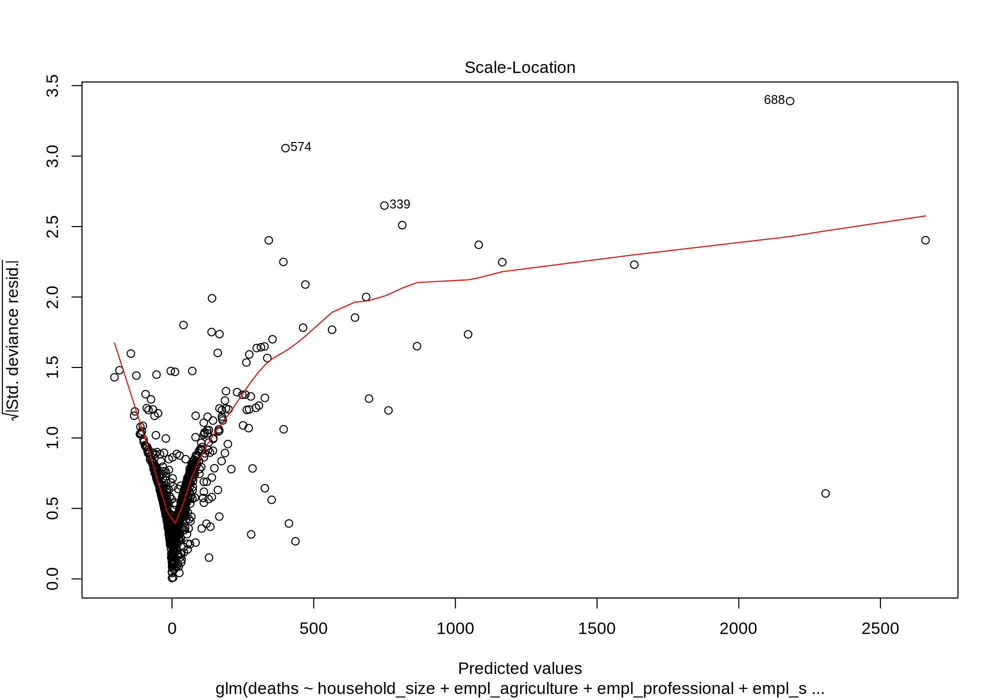

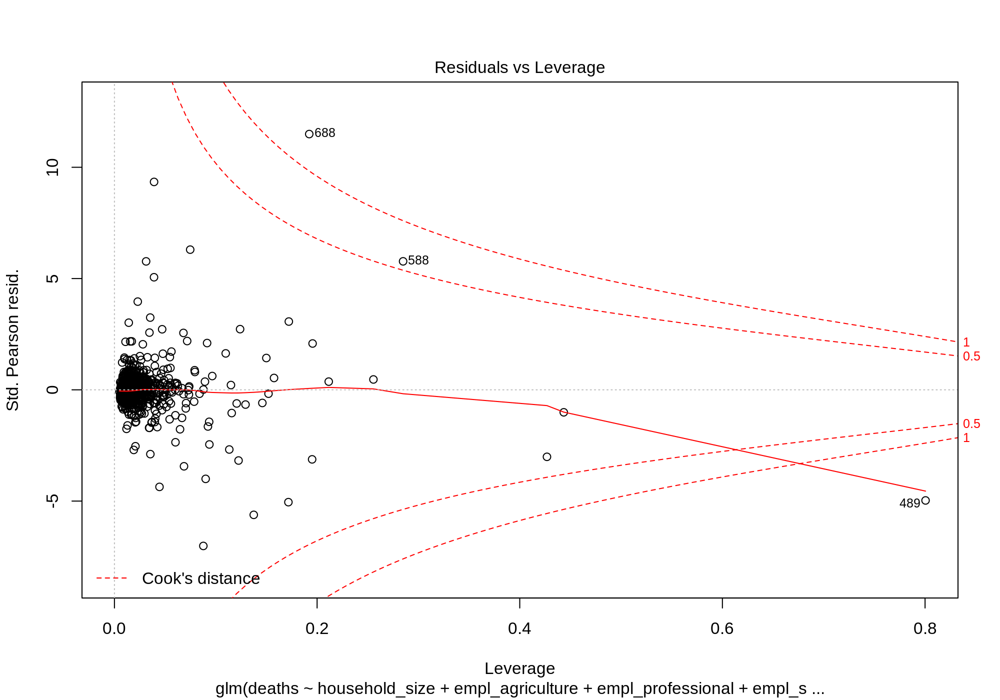

In [12]:
%%R -i abbrev -w 10 -h 7 --units in -r 200
library(boot)
mod = glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured +
          area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + 
          order + density, family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

# looks heteroskedastic, and some leverage issues

In [13]:
%%R 

cv_glm$delta

# https://stat.ethz.ch/R-manual/R-devel/library/boot/html/cv.glm.html
# The first component is the raw cross-validation estimate of prediction error. 
# The second component is the adjusted cross-validation estimate.
# The adjustment is designed to compensate for the bias introduced by not using leave-one-out cross-validation. 

# so adj. cv-error=14857.07

[1] 16338.30 16005.54


In [14]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 34851.32 34518.52

Call:
glm(formula = deaths ~ household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = gaussian, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-590.43   -64.99     0.53    53.11  2246.79  

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)                50.054      5.992   8.354 2.88e-16 ***
household_size              3.657      8.167   0.448 0.654481    
empl_professional         -41.332     11.885  -3.478 0.000533 ***
empl_social               -11.996      8.432  -1.423 0.155239    
empl_services             -17.712      7.389  -2.397 0.0

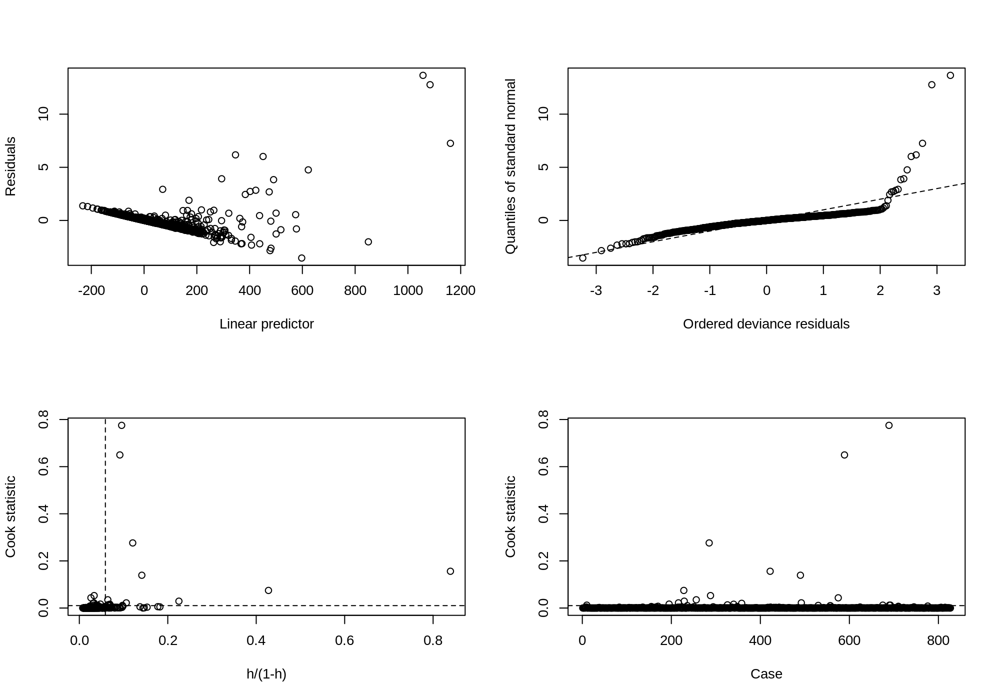

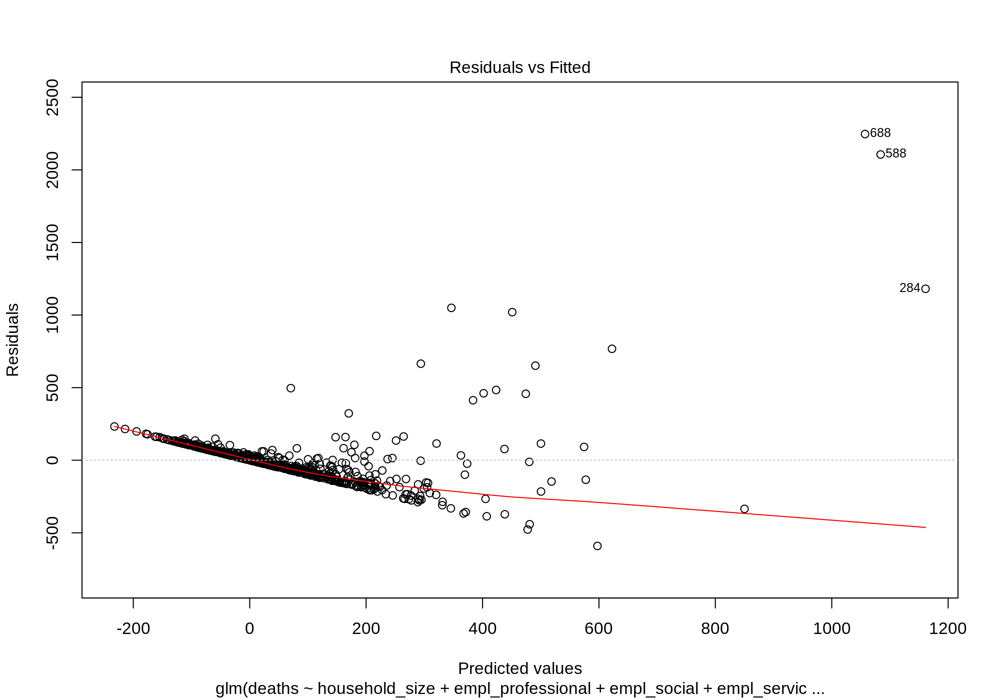

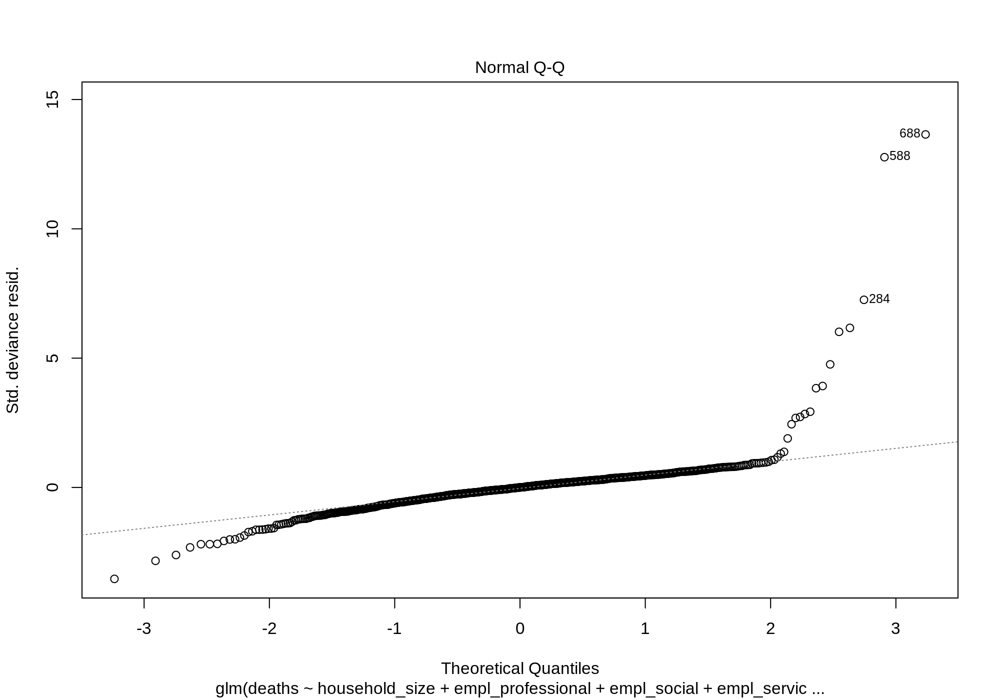

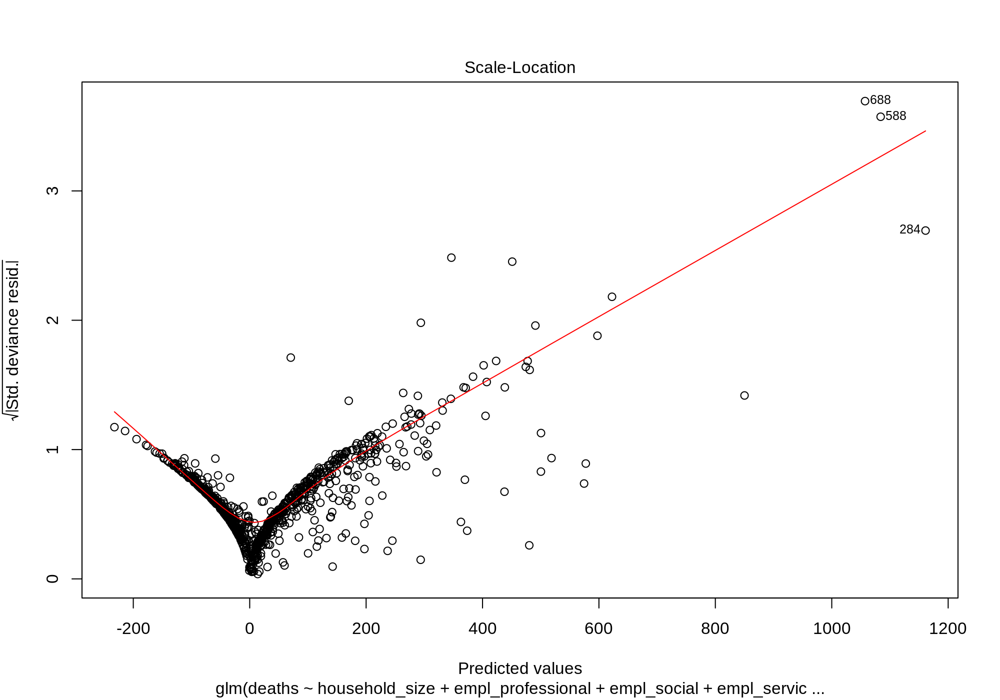

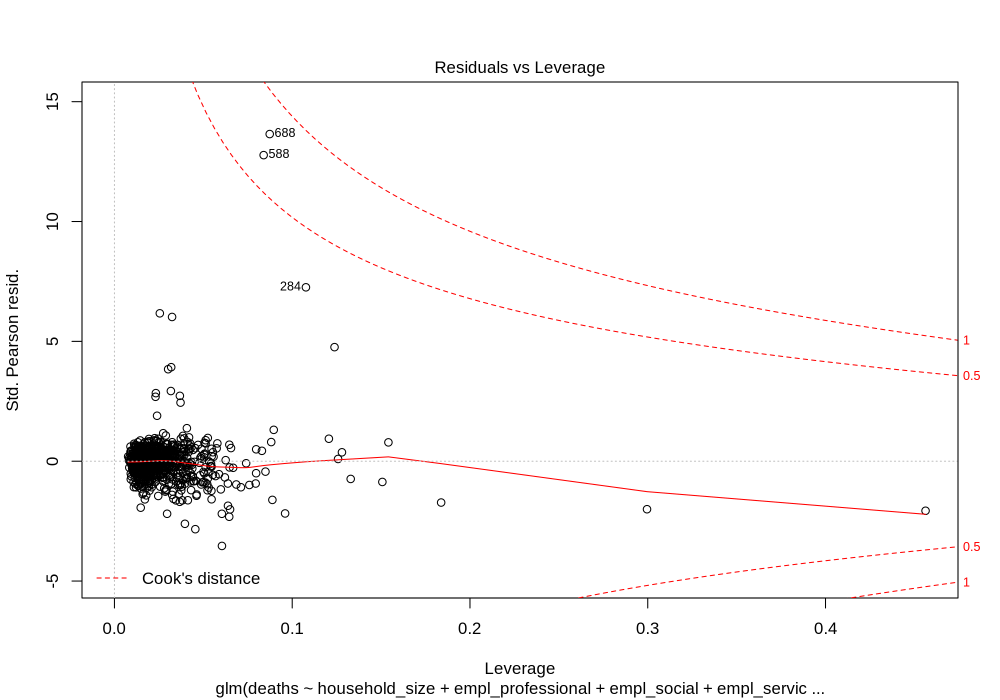

In [15]:
%%R -w 10 -h 7 --units in -r 200

mod = glm(formula = deaths ~ household_size + empl_professional + empl_social + empl_services +
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
          pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + 
          log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + 
          log_empl_agriculture + log_prc_public_transp, 
          family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

# even with the selected log-transformed predictor variables, still homoskedastic (but eliminated leverage issues)

## Linear Regression with Transformed Target

In [16]:
log_formulas[0]

'log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

[1] 1.045547 1.041363

Call:
glm(formula = log_deaths ~ household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density, family = gaussian, 
    data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-3.5200  -0.6377  -0.0266   0.6223   3.0881  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.076141   0.034767  59.716  < 2e-16 ***
household_size         0.009775   0.047973   0.204 0.838587    
empl_agriculture      -0.095267   0.043979  -2.166 0.030588 *  
empl_professional     -0.004498   0.068212  -0.066 0.947435    
empl_social            0.026266   0.048680   0.540 0.589652    
empl_services         -0.12551

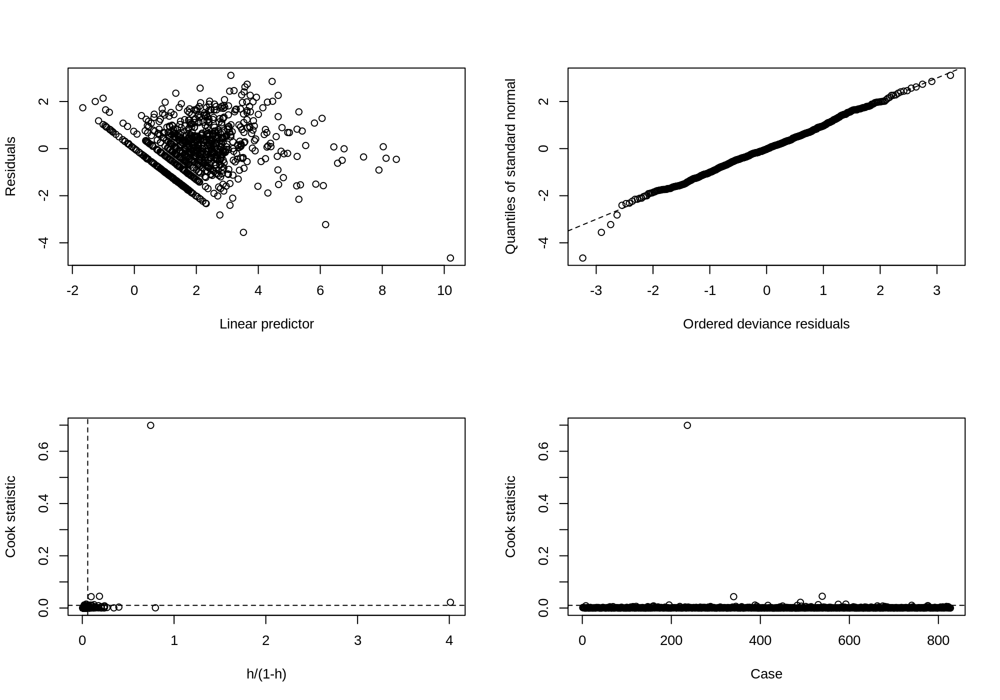

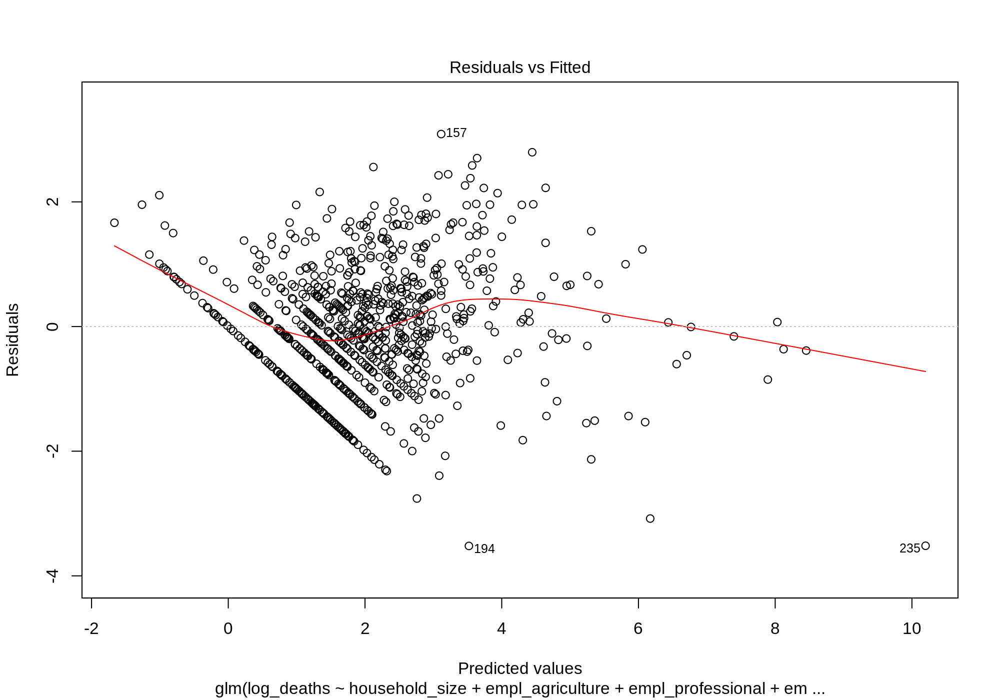

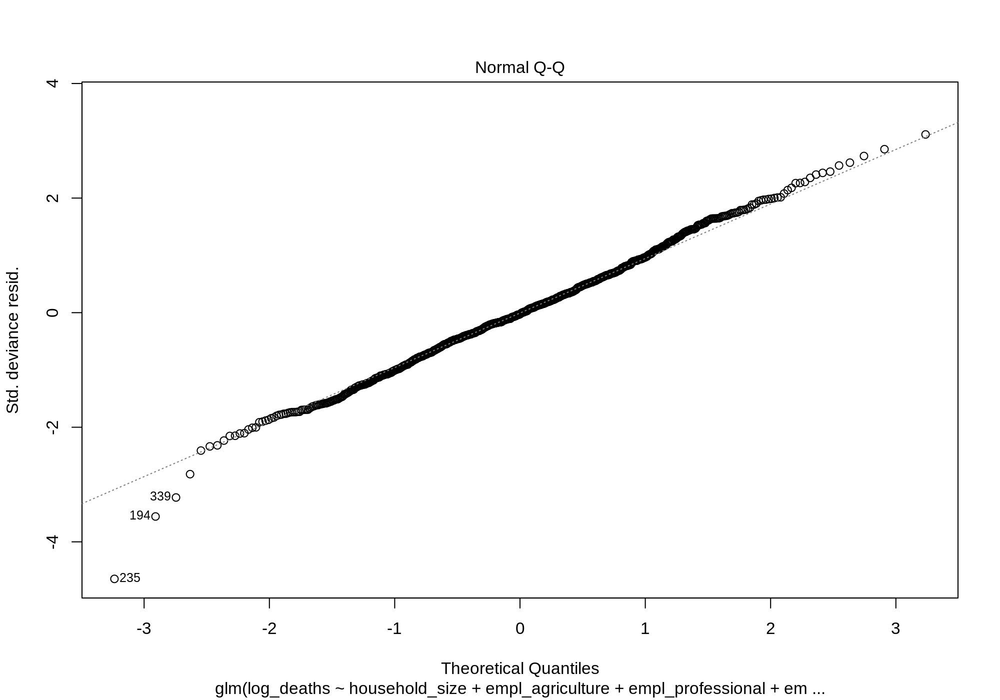

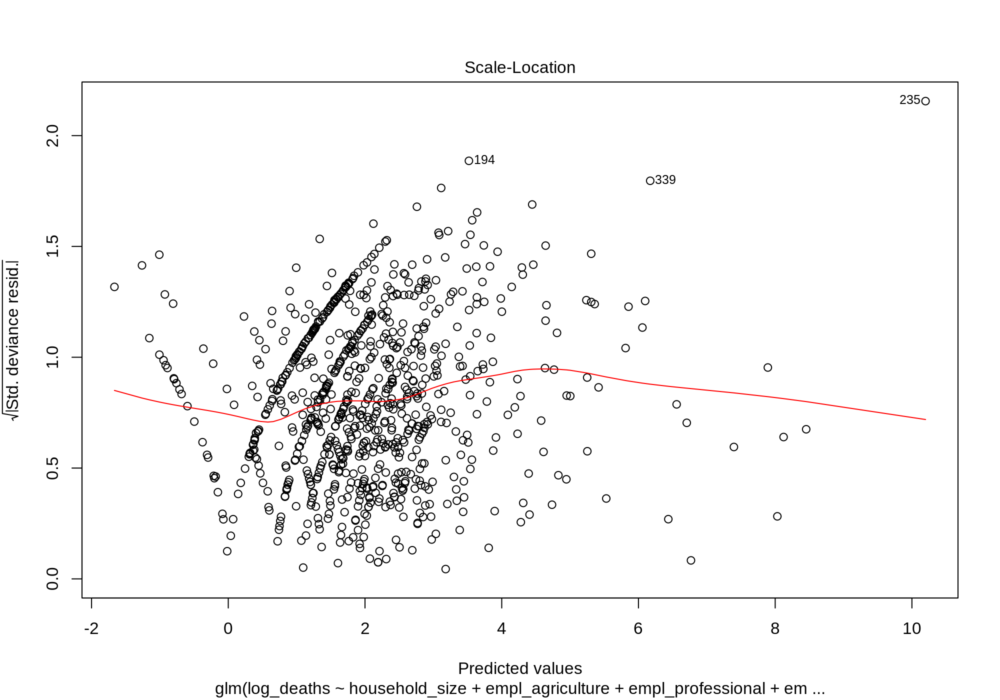

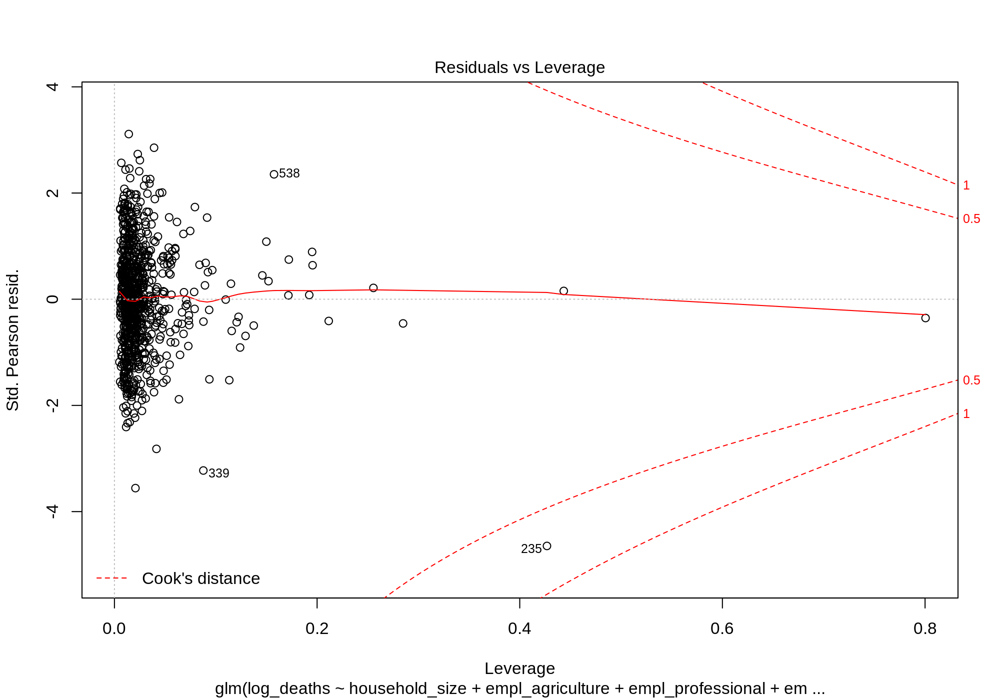

In [17]:
%%R -w 10 -h 7 --units in -r 200

mod = glm(formula = log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured +
          area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + 
          order + density, family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

# transforming target helped with the leverage, but not heteroskedasticity - use a different model instead (poisson?)

In [18]:
log_formulas[2]

'log_deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 0.9039793 0.9013343

Call:
glm(formula = log_deaths ~ household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = gaussian, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-4.0697  -0.6374  -0.0030   0.5803   2.4194  

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)              2.076141   0.032608  63.670  < 2e-16 ***
household_size           0.029466   0.044448   0.663 0.507571    
empl_professional       -0.175556   0.064681  -2.714 0.006786 ** 
empl_social              0.023759   0.045891   0.518 0.604784    
empl_services           -0.122078   0.040211  -3.0

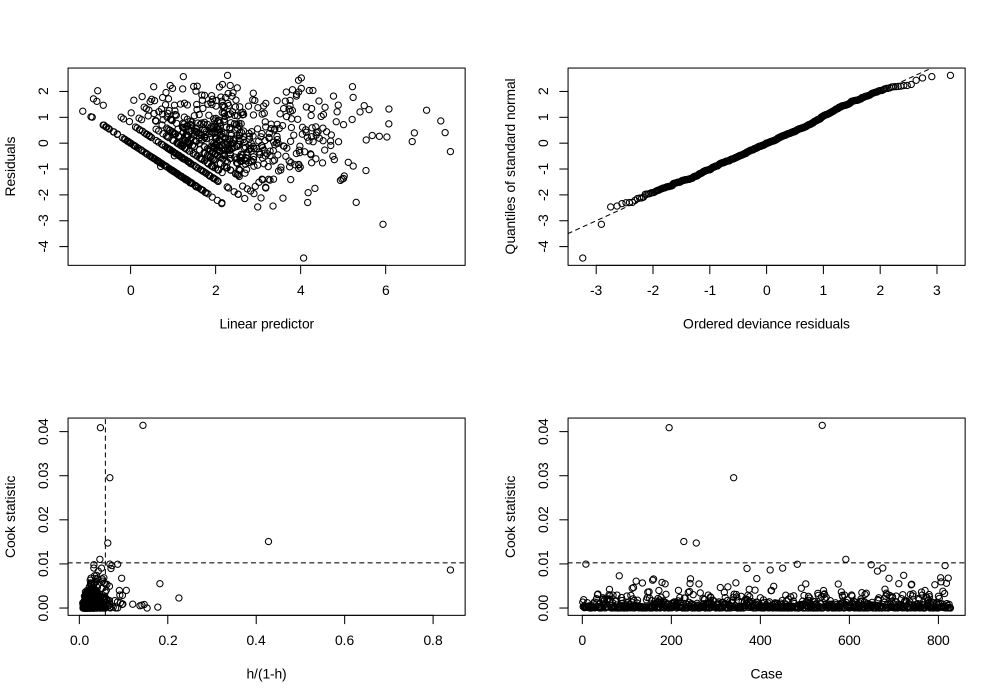

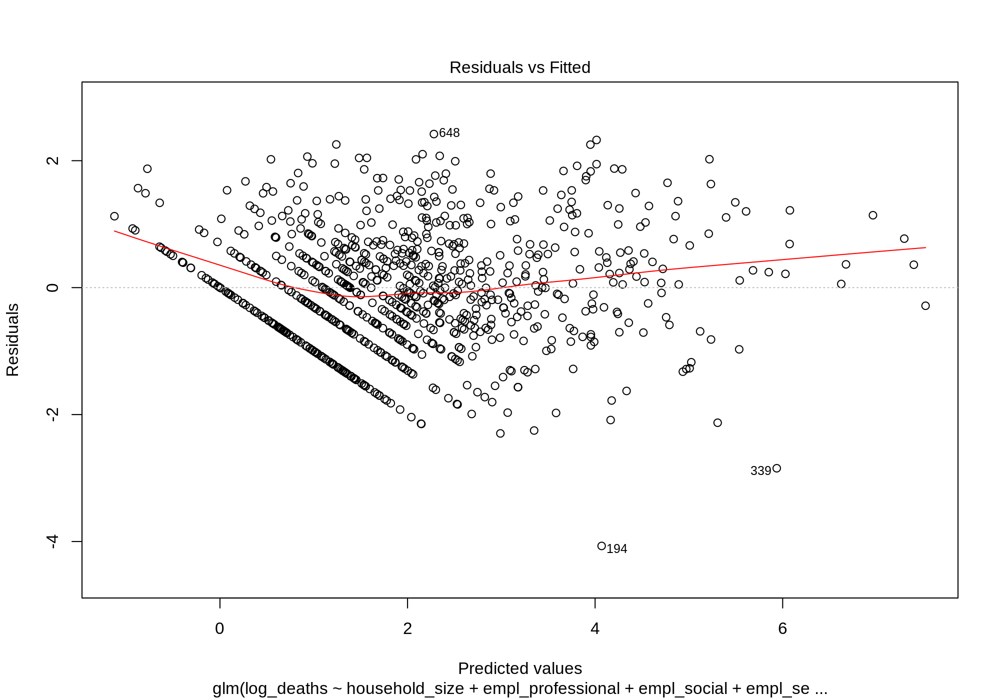

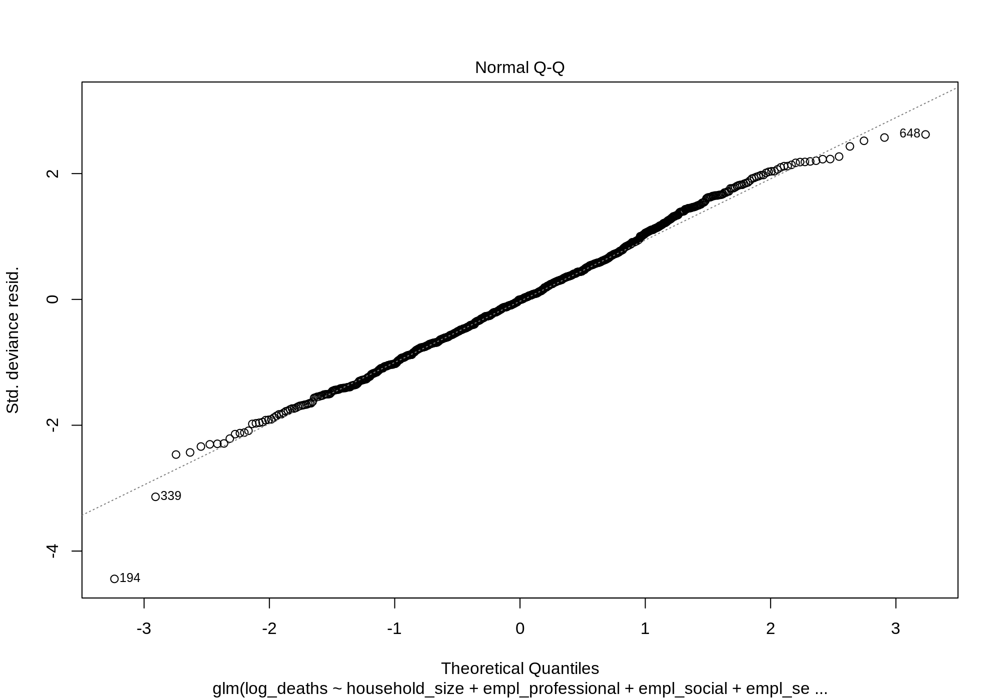

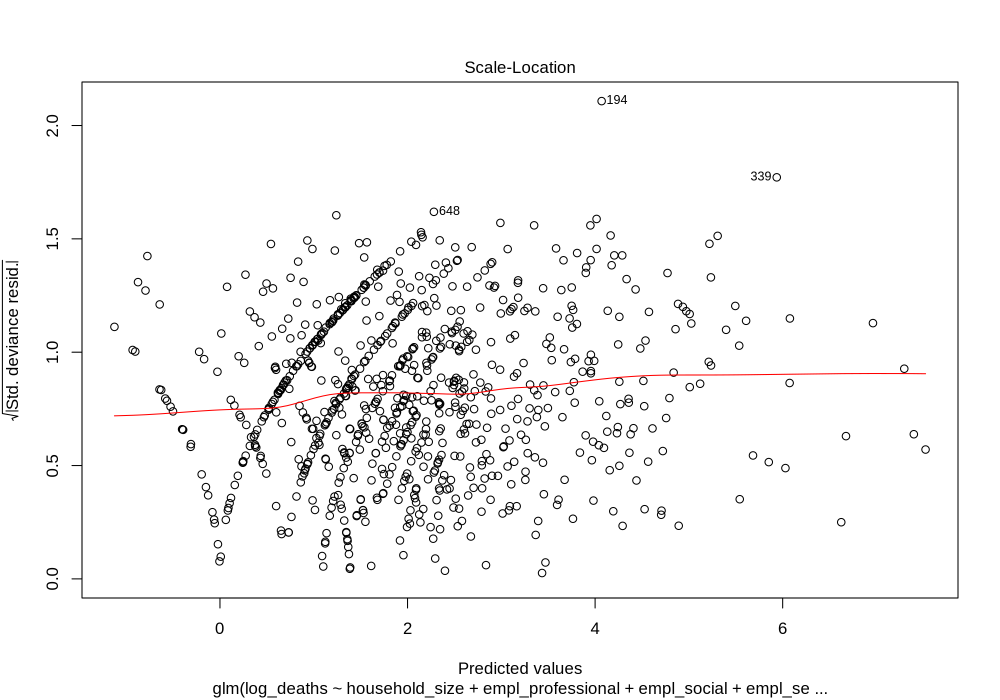

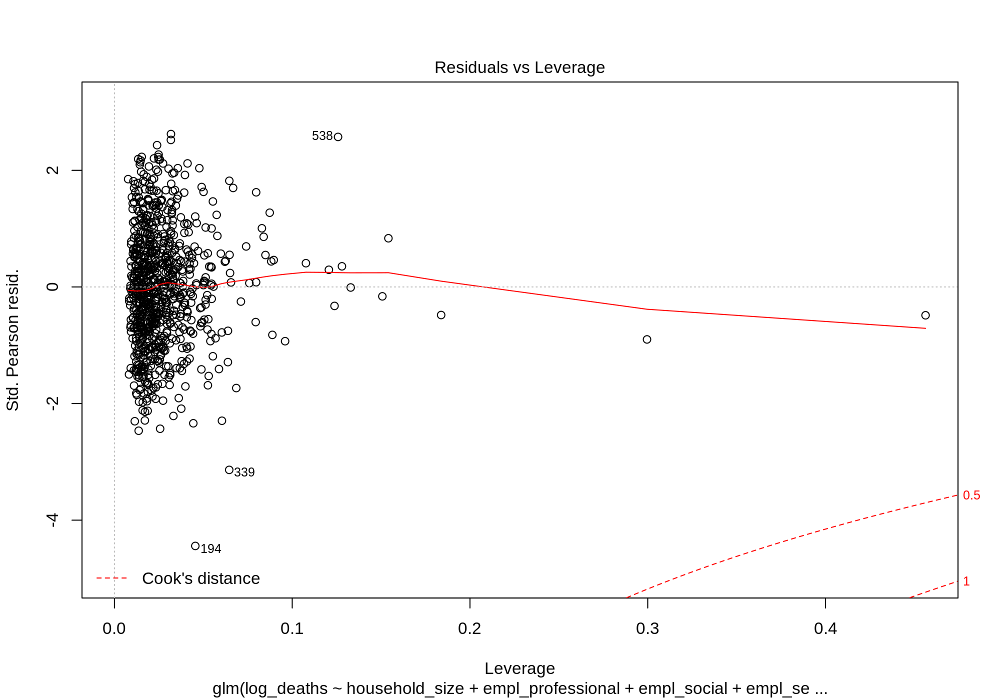

In [19]:
%%R -w 10 -h 7 --units in -r 200

mod = glm(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
          pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + 
          log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + 
          log_empl_agriculture + log_prc_public_transp, family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

# even with transformed target and select transformed predictors, heteroskedasticity

## Poisson-Family GLM

In [20]:
formulas[0]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

[1] 50163516 45130775

Call:
glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + 
    population + pop_65_plus + uninsured + area + incarcerated + 
    domestic_passengers + intl_passengers + prc_obese + ten_plus + 
    order + density, family = poisson(link = "log"), data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-28.541   -3.748   -1.640    0.711   47.267  

Coefficients:
                       Estimate Std. Error z value Pr(>|z|)    
(Intercept)            2.371038   0.013350 177.603  < 2e-16 ***
household_size         0.026324   0.008487   3.102  0.00192 ** 
empl_agriculture      -0.843034   0.022373 -37.680  < 2e-16 ***
empl_professional     -0.287384   0.013335 -21.551  < 2e-16 ***
empl_social           -0.112237   0.010950 -10.250  < 2e-16 ***
empl_services         -0.3

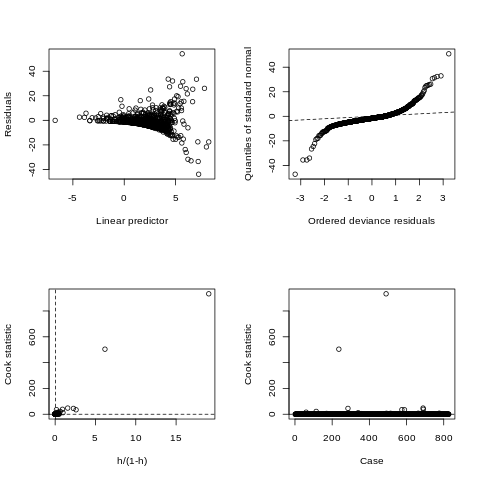

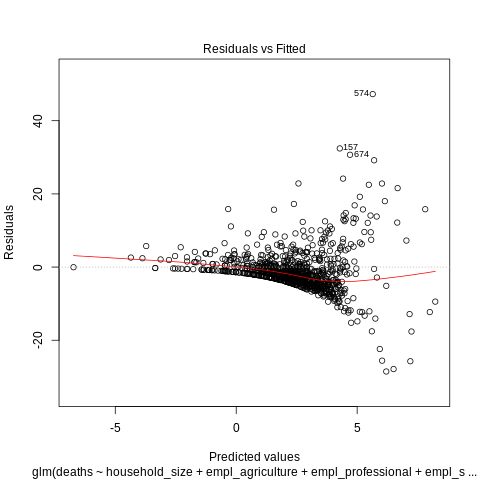

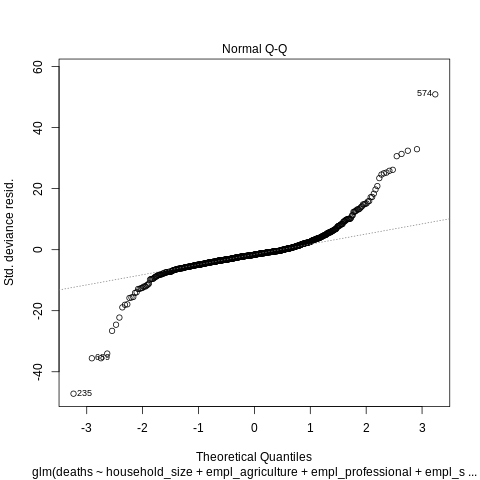

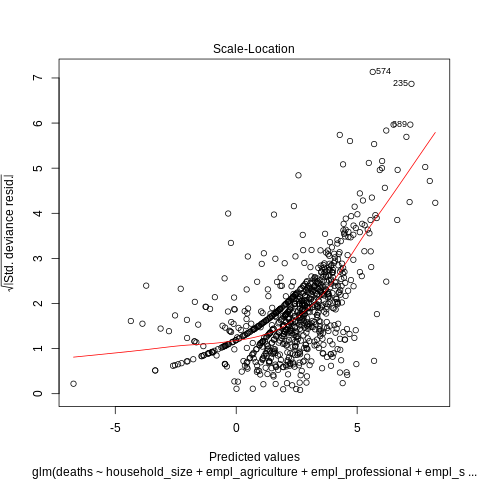

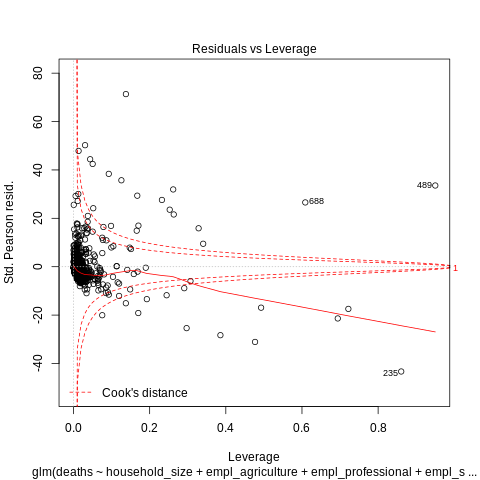

In [21]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured +
          area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + 
          order + density, family = poisson(link = "log"), data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [22]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 14283.77 13536.71

Call:
glm(formula = deaths ~ household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = poisson(link = "log"), data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-24.483   -3.114   -1.344    0.828   37.502  

Coefficients:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)               2.274045   0.013162 172.775  < 2e-16 ***
household_size            0.094064   0.008493  11.076  < 2e-16 ***
empl_professional        -0.484505   0.013008 -37.247  < 2e-16 ***
empl_social              -0.084603   0.011685  -7.240 4.48e-13 ***
empl_services            -0.230853   0

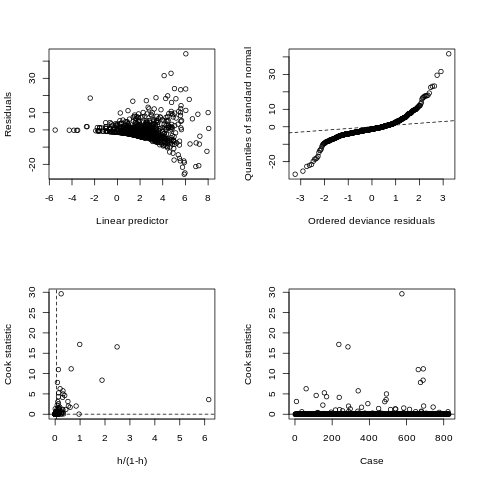

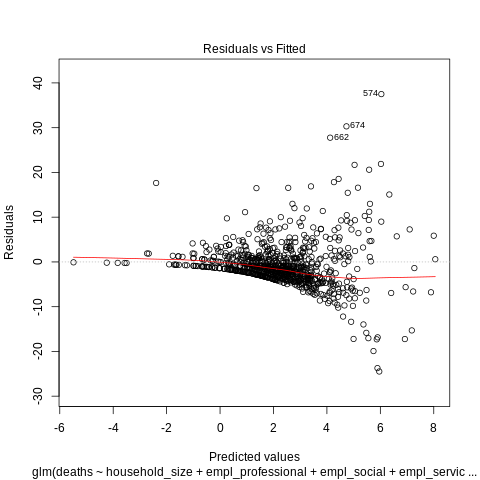

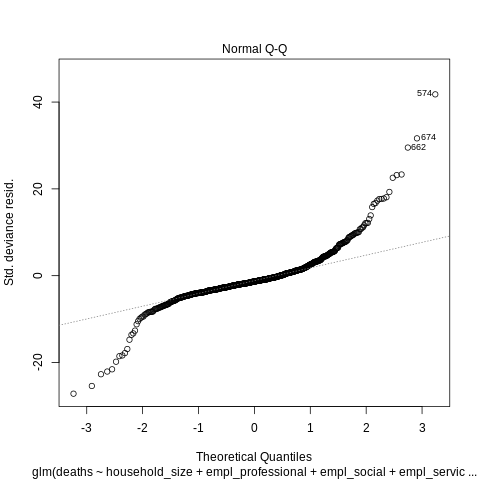

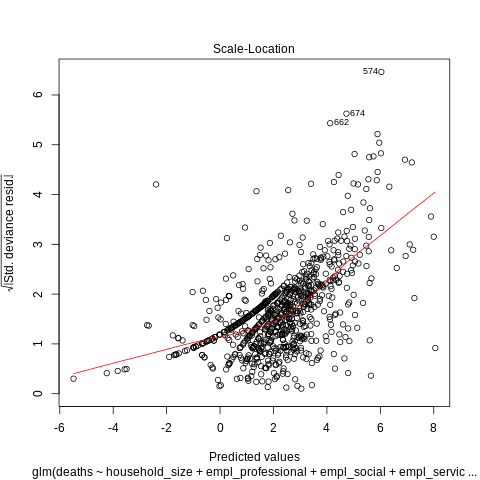

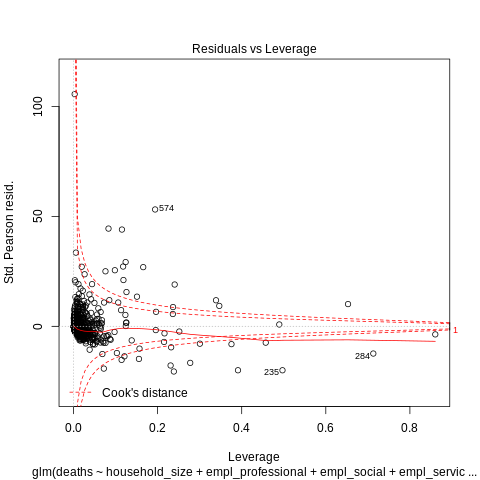

In [23]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_density + log_intl_passengers + log_domestic_passengers + log_area + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
          family = poisson(link = "log"), data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

## Poisson Family GLM with Transformed Target

In [24]:
log_formulas[0]

'log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

[1] 1.850420 1.780935

Call:
glm(formula = log_deaths ~ household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density, family = poisson(link = "log"), 
    data = abbrev)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.95606  -0.63048  -0.00856   0.45448   1.76431  

Coefficients:
                       Estimate Std. Error z value Pr(>|z|)    
(Intercept)            0.537055   0.028845  18.618  < 2e-16 ***
household_size         0.007549   0.033371   0.226  0.82103    
empl_agriculture      -0.091105   0.036842  -2.473  0.01340 *  
empl_professional      0.004759   0.050832   0.094  0.92541    
empl_social           -0.009196   0.038142  -0.241  0.80948    
empl_se

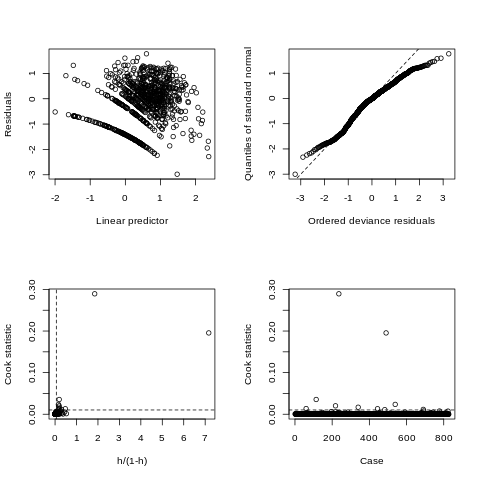

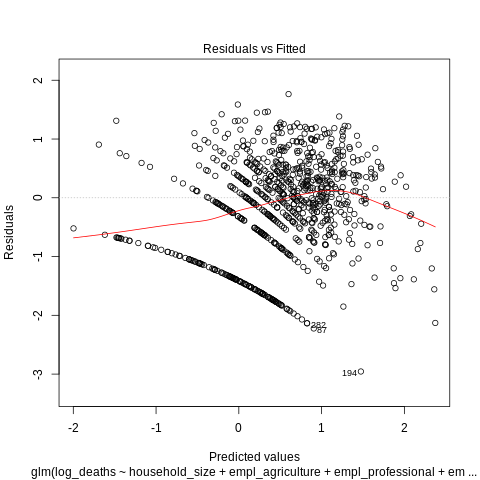

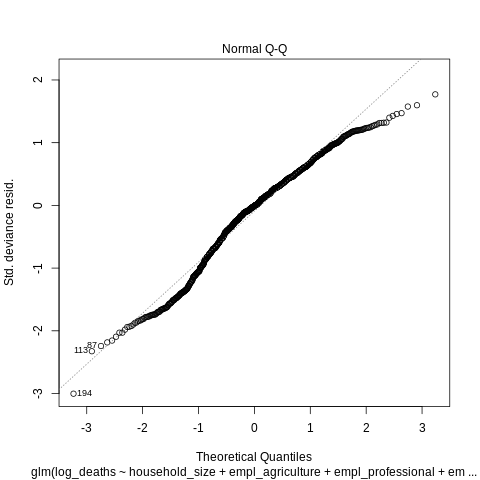

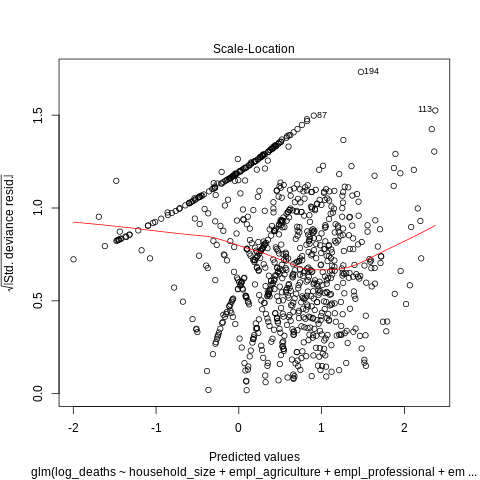

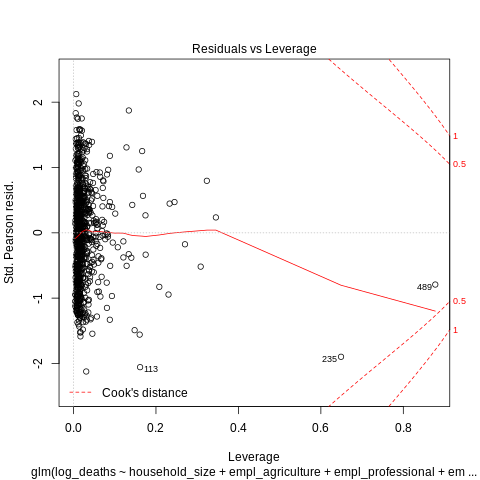

In [25]:
%%R -i abbrev

mod = glm(formula = log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + 
          domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density, 
          family = poisson(link = "log"), data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)
# at least leverage is less of an issue

In [26]:
log_formulas[2]

'log_deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 1.065990 1.058444

Call:
glm(formula = log_deaths ~ household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = poisson(link = "log"), data = abbrev)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.90828  -0.60203  -0.00428   0.44174   2.33691  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)              0.534045   0.028848  18.512  < 2e-16 ***
household_size           0.016092   0.033148   0.485  0.62735    
empl_professional       -0.057803   0.051677  -1.119  0.26334    
empl_social              0.011360   0.039611   0.287  0.77428    
empl_services           -0.05

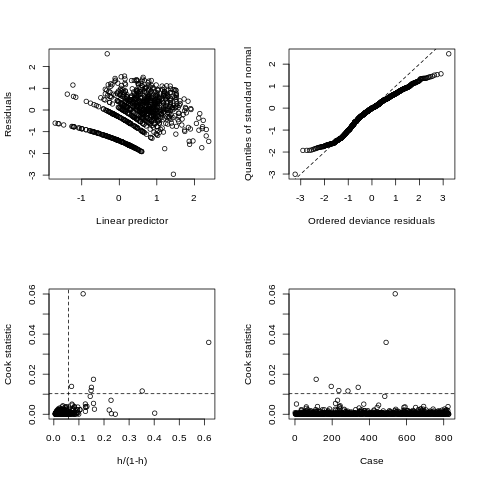

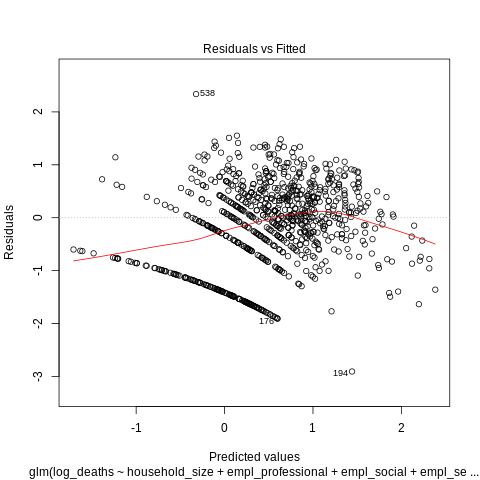

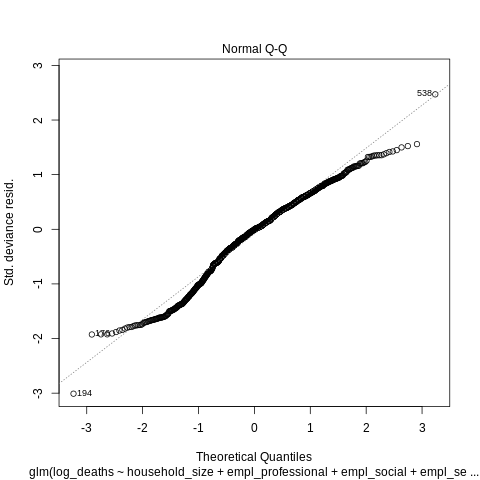

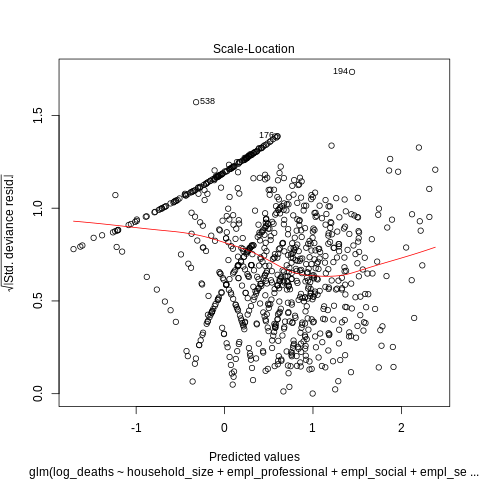

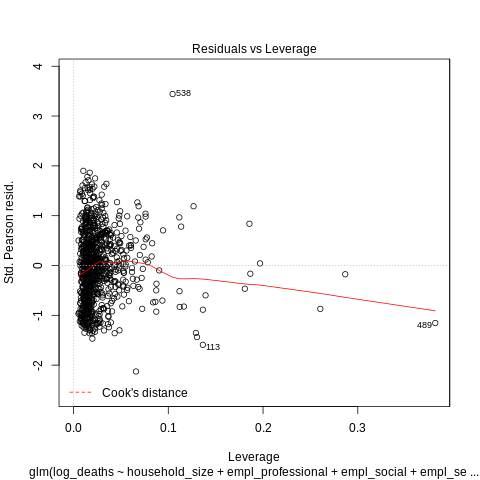

In [27]:
%%R -i abbrev

mod = glm(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
          pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + 
          log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + 
          log_empl_agriculture + log_prc_public_transp, 
          family = poisson(link = "log"), data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

## Quasipoisson Family GLM

In [28]:
formulas[0]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

[1] 118253.5 108227.8

Call:
glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + 
    population + pop_65_plus + uninsured + area + incarcerated + 
    domestic_passengers + intl_passengers + prc_obese + ten_plus + 
    order + density, family = quasipoisson, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-28.541   -3.748   -1.640    0.711   47.267  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.371038   0.096317  24.617  < 2e-16 ***
household_size         0.026324   0.061228   0.430 0.667364    
empl_agriculture      -0.843034   0.161416  -5.223 2.25e-07 ***
empl_professional     -0.287384   0.096207  -2.987 0.002902 ** 
empl_social           -0.112237   0.079003  -1.421 0.155799    
empl_services         -0.332737   0

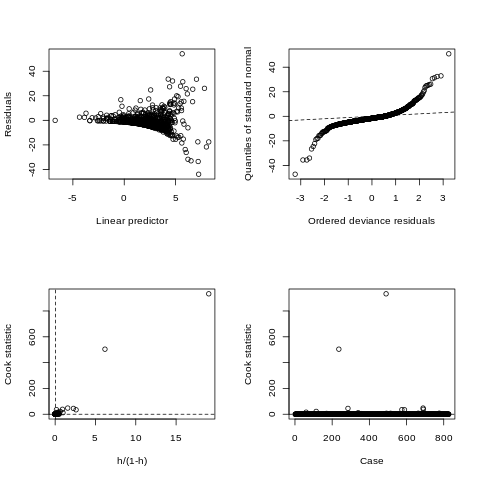

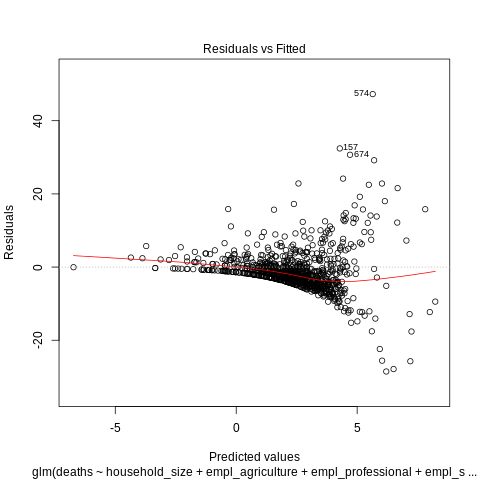

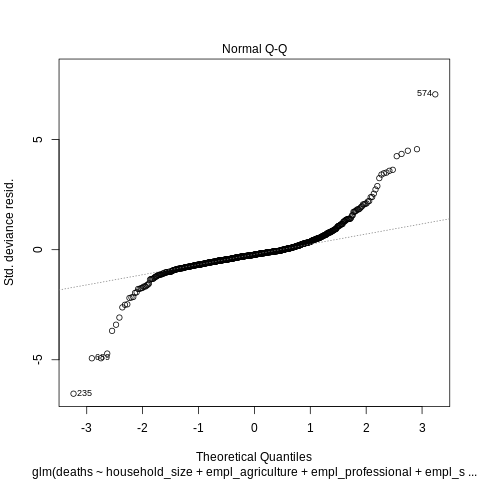

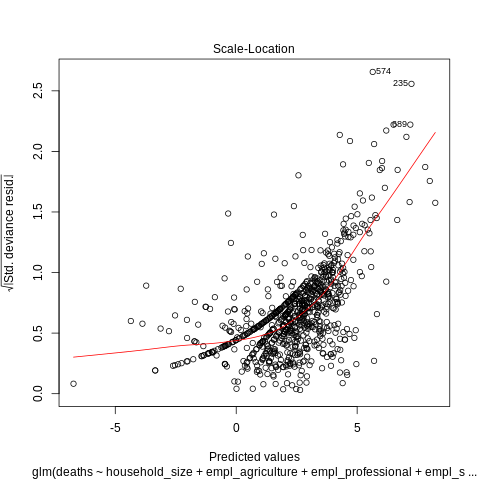

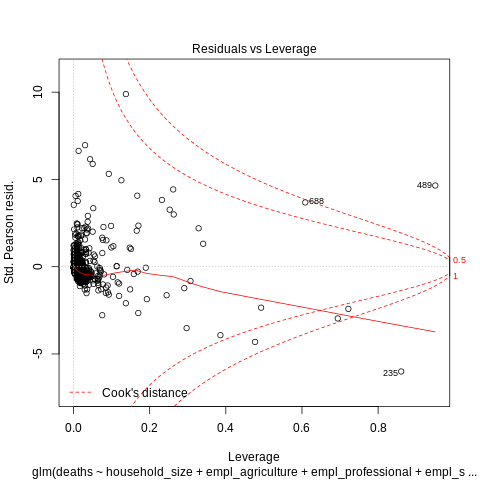

In [29]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + 
          uninsured + area + incarcerated + domestic_passengers + intl_passengers + 
          prc_obese + ten_plus + order + density, 
          family = quasipoisson, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [30]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 14985.85 14226.50

Call:
glm(formula = deaths ~ household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = quasipoisson, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-24.483   -3.114   -1.344    0.828   37.502  

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)               2.274045   0.091175  24.941  < 2e-16 ***
household_size            0.094064   0.058831   1.599 0.110241    
empl_professional        -0.484505   0.090109  -5.377 9.94e-08 ***
empl_social              -0.084603   0.080947  -1.045 0.296262    
empl_services            -0.230853   0.070924  

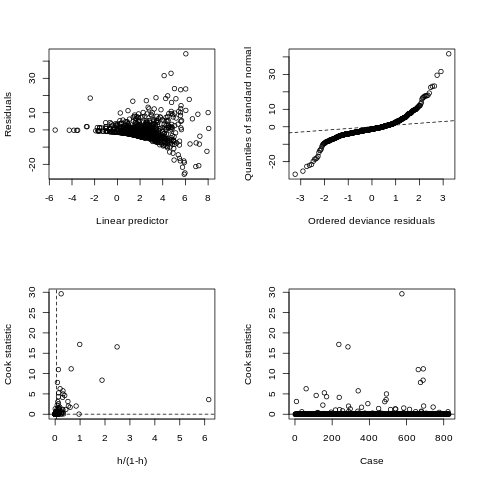

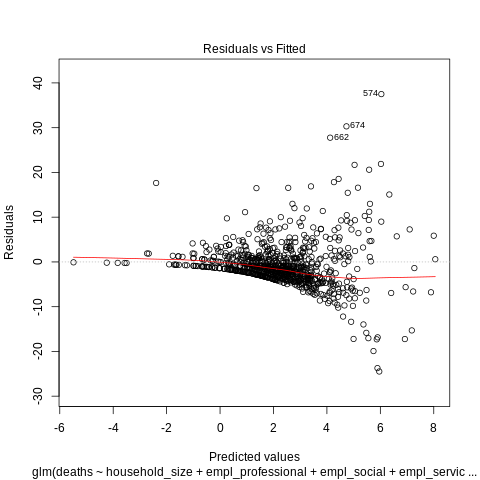

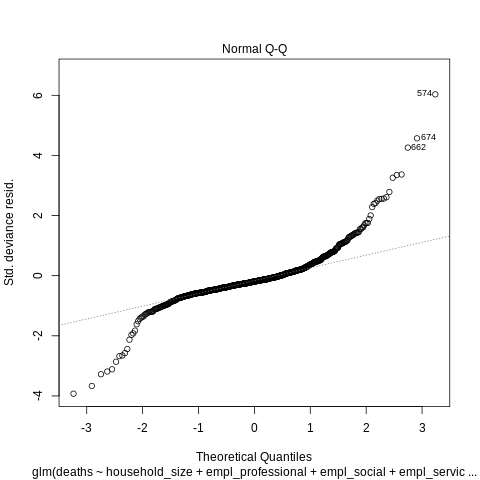

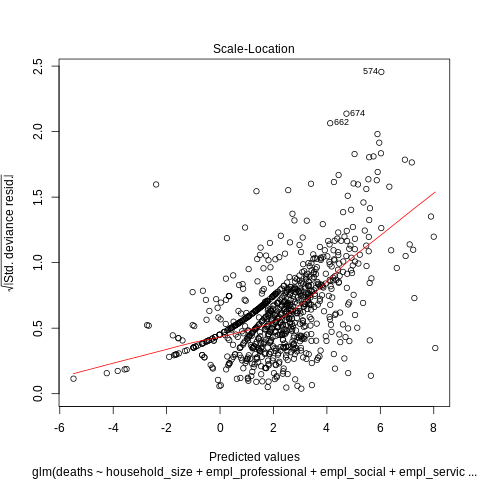

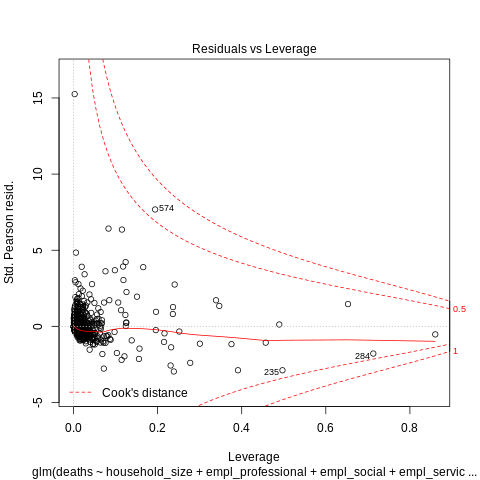

In [31]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_density + log_intl_passengers + log_domestic_passengers + log_area + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
          family = quasipoisson, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

# high dispersion since dispersion parameter = 47.something > 1
# https://cran.r-project.org/web/packages/pscl/vignettes/countreg.pdf

#actually respects assumption of linearity for poisson??
# https://bookdown.org/egarpor/PM-UC3M/glm-diagnostics.html

## Quasipoisson Family GLM with Transformed Response Variable


In [32]:
log_formulas[0]

'log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

[1] 1.409098 1.384424

Call:
glm(formula = log_deaths ~ household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density, family = quasipoisson, 
    data = abbrev)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.95606  -0.63048  -0.00856   0.45448   1.76431  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            0.537055   0.021198  25.335  < 2e-16 ***
household_size         0.007549   0.024524   0.308 0.758287    
empl_agriculture      -0.091105   0.027075  -3.365 0.000802 ***
empl_professional      0.004759   0.037356   0.127 0.898665    
empl_social           -0.009196   0.028030  -0.328 0.742937    
empl_services   

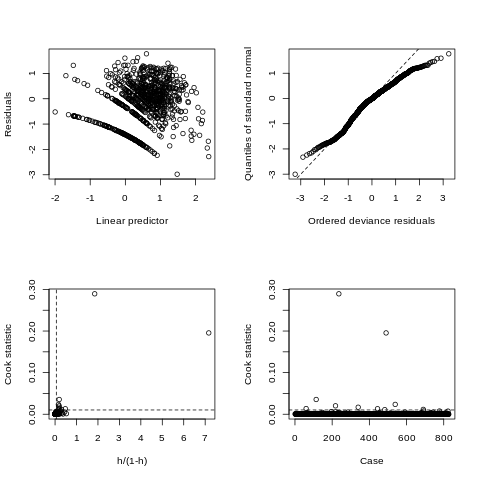

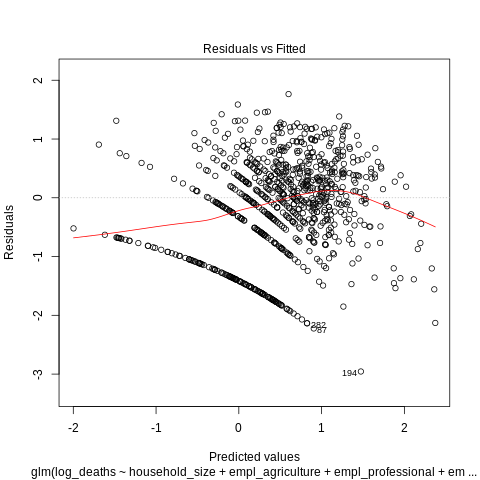

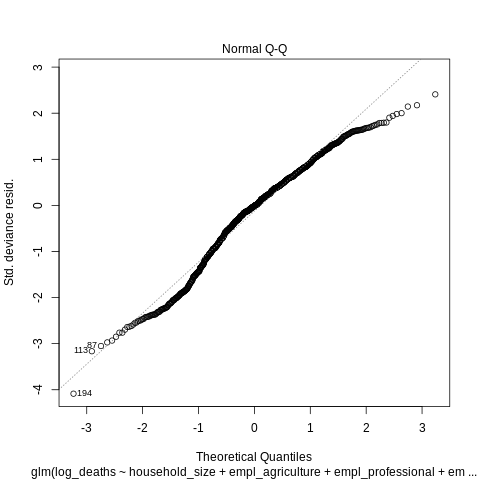

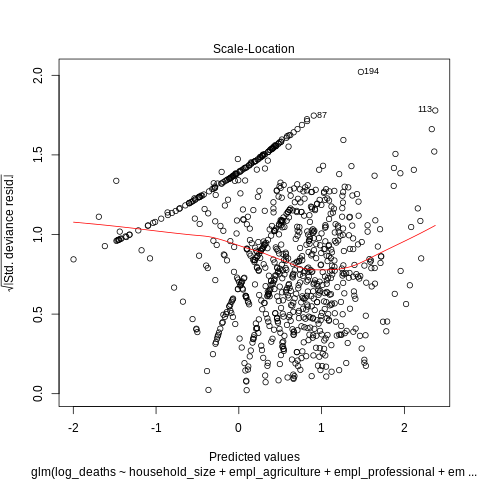

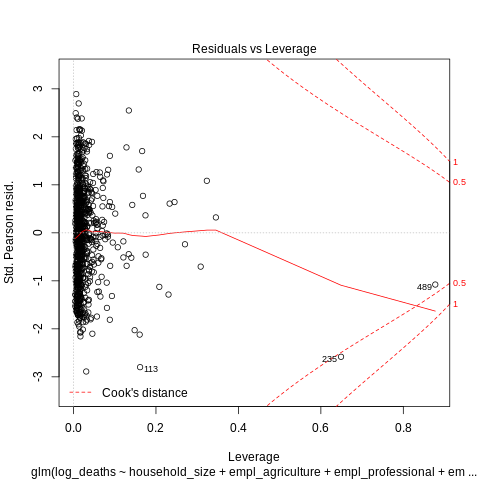

In [33]:
%%R -i abbrev

mod = glm(formula = log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + 
          incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density, 
          family = quasipoisson, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

# better about the overdispersion

In [34]:
log_formulas[2]

'log_deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 1.058973 1.051989

Call:
glm(formula = log_deaths ~ household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = quasipoisson, data = abbrev)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.90828  -0.60203  -0.00428   0.44174   2.33691  

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)              0.534045   0.020648  25.864  < 2e-16 ***
household_size           0.016092   0.023726   0.678 0.497804    
empl_professional       -0.057803   0.036988  -1.563 0.118507    
empl_social              0.011360   0.028352   0.401 0.688768    
empl_services           -0.057527   0.

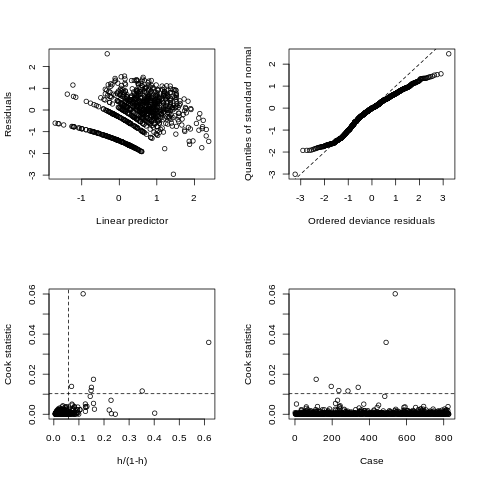

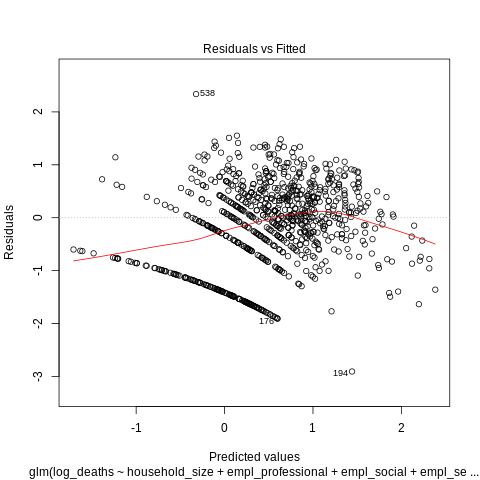

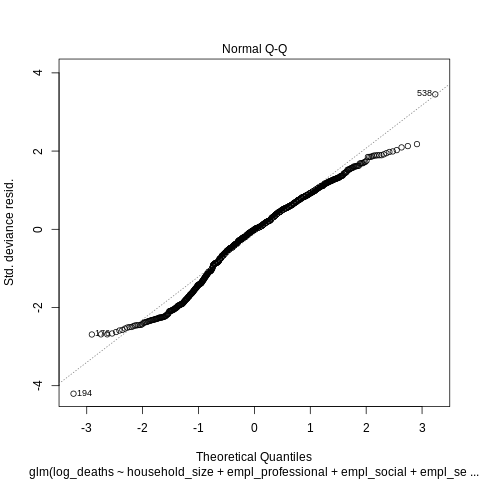

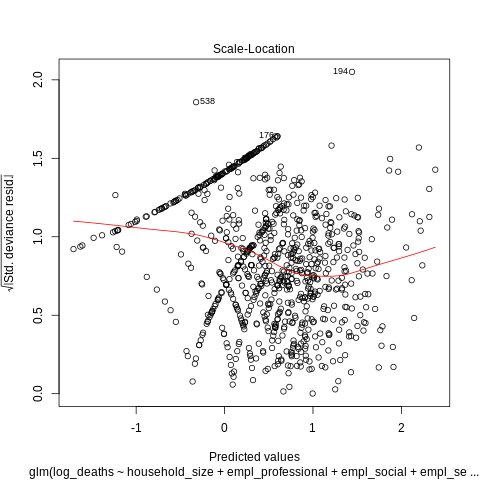

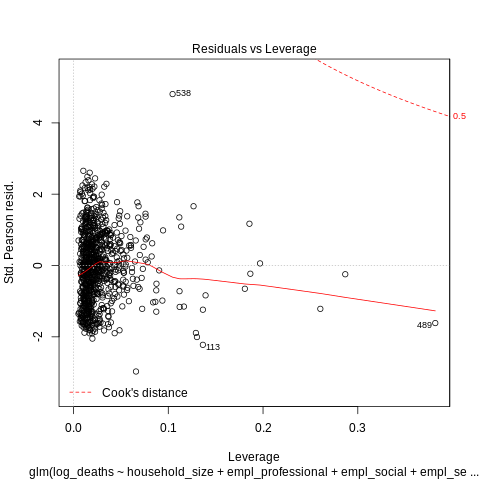

In [35]:
%%R -i abbrev

mod = glm(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_density + log_intl_passengers + log_domestic_passengers + log_area + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
          family = quasipoisson, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

# finally not overdispersed.  

In [36]:
%%R 

# https://data.princeton.edu/wws509/r/overdispersion
print(" five-percent critical value for a chi-squared with 804 d.f.: ")
print(qchisq(0.95, df.residual(mod)))
print("deviance: ")
print(deviance(mod))
pr <- residuals(mod,"pearson")
print("pearson's chi-squared: ")
print(sum(pr^2))

# so pretty good fit?

[1] " five-percent critical value for a chi-squared with 804 d.f.: "
[1] 871.0757
[1] "deviance: "
[1] 514.4349
[1] "pearson's chi-squared: "
[1] 411.894


## Negative Binomial Regression

similar to quasi-poisson, but with info criteria more readily available? (https://cran.r-project.org/web/packages/pscl/vignettes/countreg.pdf)

In [37]:
log_formulas[0]

'log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

[1] 1.386322 1.362814

Call:
glm.nb(formula = log_deaths ~ household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density, data = abbrev, init.theta = 48182.92983, 
    link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.95601  -0.75717  -0.00857   0.46700   1.76426  

Coefficients:
                       Estimate Std. Error z value Pr(>|z|)    
(Intercept)            0.537053   0.028846  18.618  < 2e-16 ***
household_size         0.007550   0.033372   0.226  0.82102    
empl_agriculture      -0.091102   0.036842  -2.473  0.01341 *  
empl_professional      0.004760   0.050833   0.094  0.92540    
empl_social           -0.009195   0.038143  -0.241  0.80950   

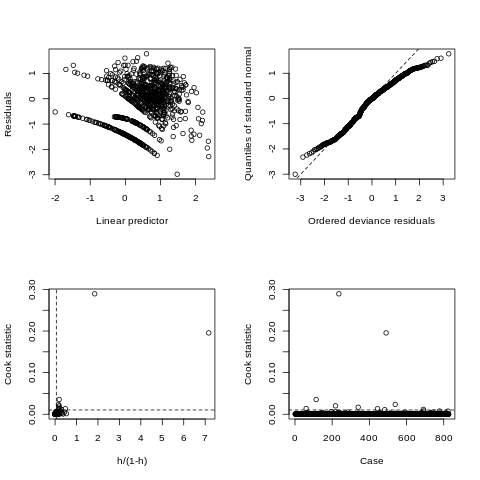

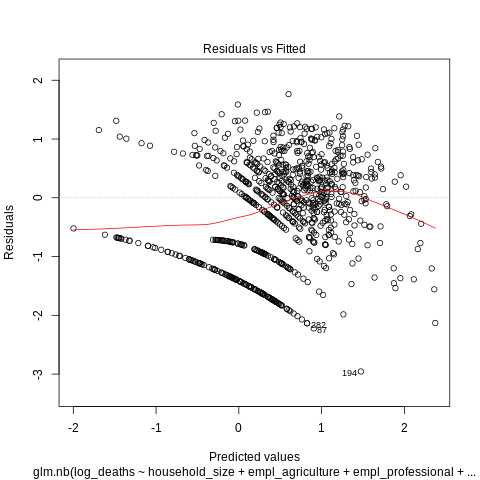

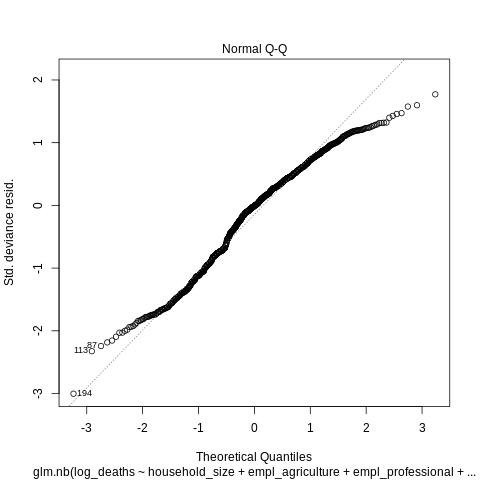

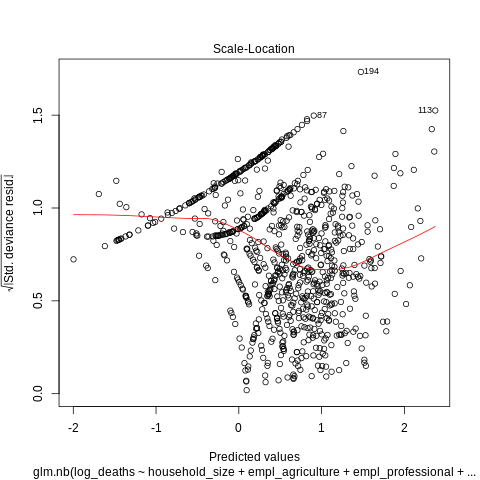

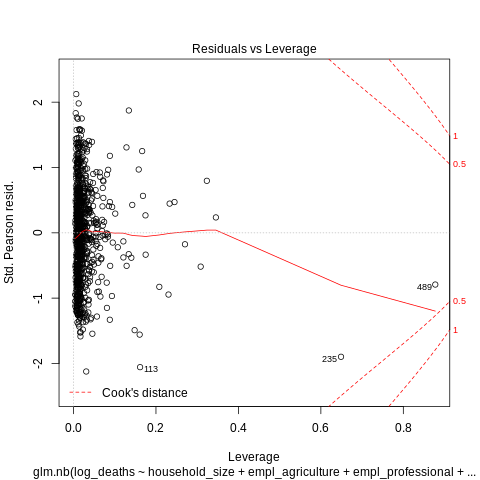

In [38]:
%%R -i abbrev
library(MASS)

mod = glm.nb(formula = log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + 
          domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [39]:
log_formulas[1]

'log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24'

[1] 1.638293 1.590733

Call:
glm.nb(formula = log_deaths ~ household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density + cases_march24, data = abbrev, 
    init.theta = 48071.05353, link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.97796  -0.75627  -0.00616   0.46638   1.75425  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            0.5364291  0.0288905  18.568  < 2e-16 ***
household_size         0.0085273  0.0334339   0.255 0.798684    
empl_agriculture      -0.0910277  0.0368239  -2.472 0.013437 *  
empl_professional      0.0019663  0.0511609   0.038 0.969341    
empl_social           -0.0091801  0.03810

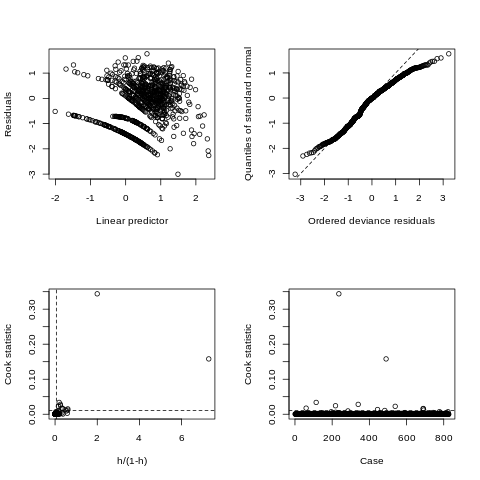

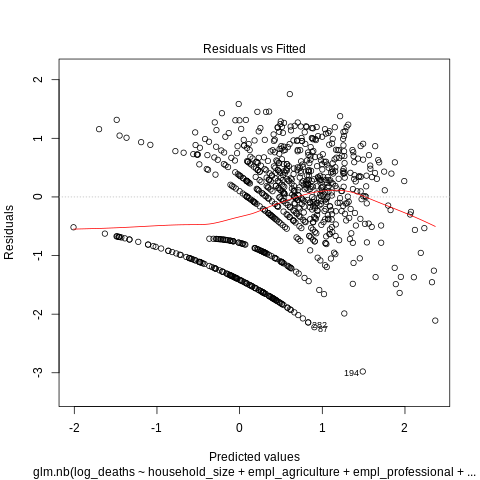

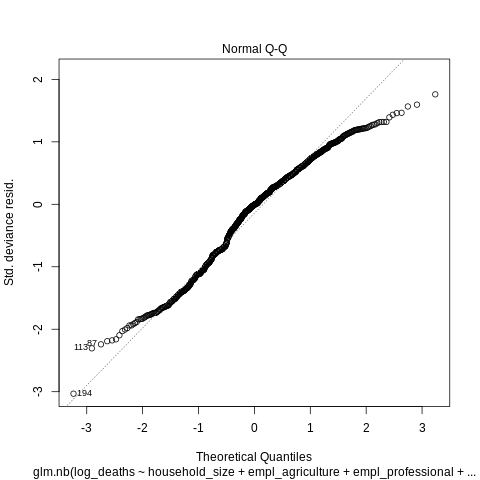

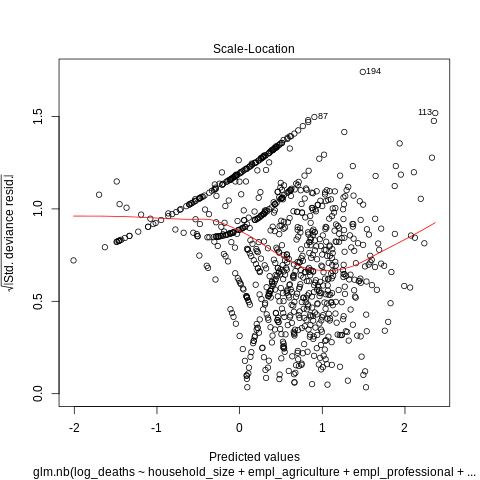

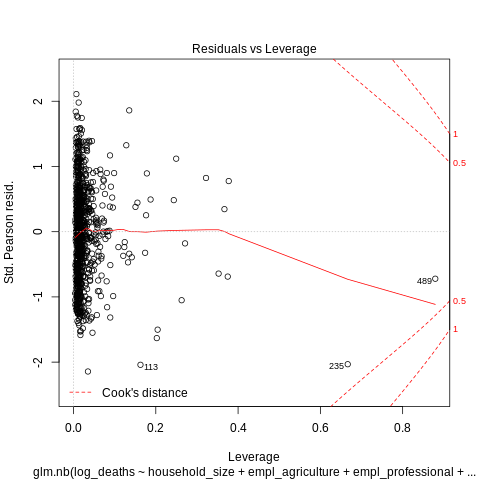

In [40]:
%%R -i abbrev

mod = glm.nb(formula = log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + 
          domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24, 
             data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [41]:
log_formulas[2]

'log_deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 1.047627 1.041626

Call:
glm.nb(formula = log_deaths ~ household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    data = abbrev, init.theta = 51647.21274, link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.90824  -0.76080  -0.00447   0.46273   2.33685  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)              0.53404    0.02885  18.512  < 2e-16 ***
household_size           0.01609    0.03315   0.485  0.62735    
empl_professional       -0.05780    0.05168  -1.119  0.26335    
empl_social              0.01136    0.03961   0.287  0.77427    
empl_services           -

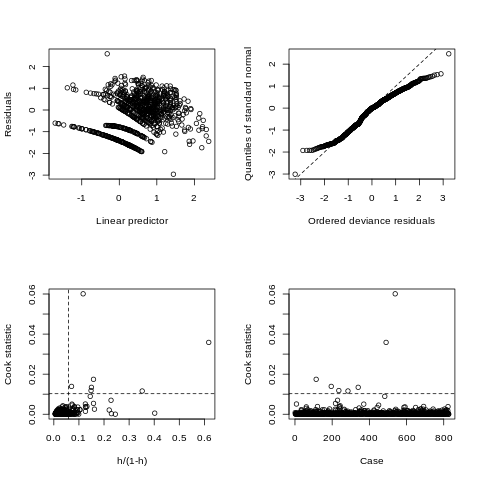

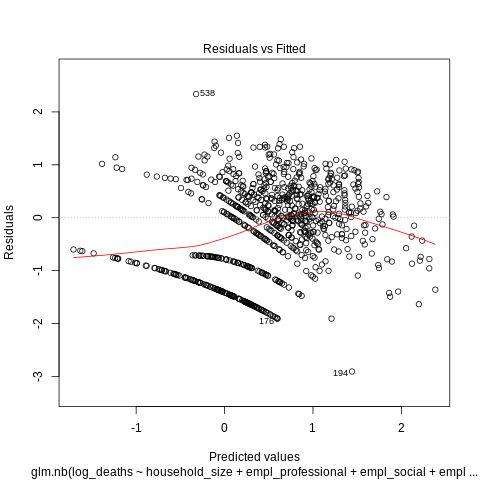

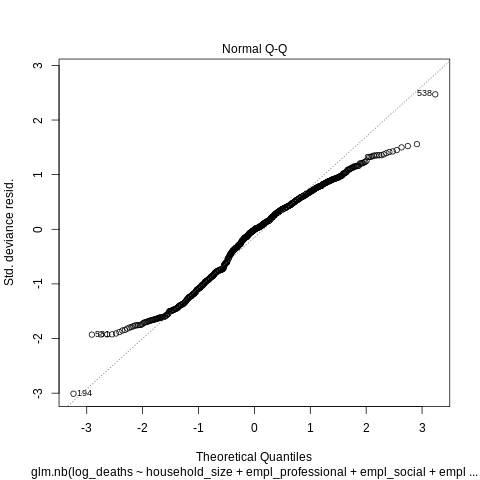

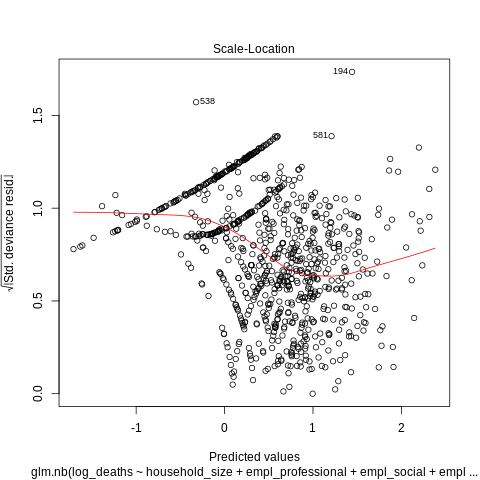

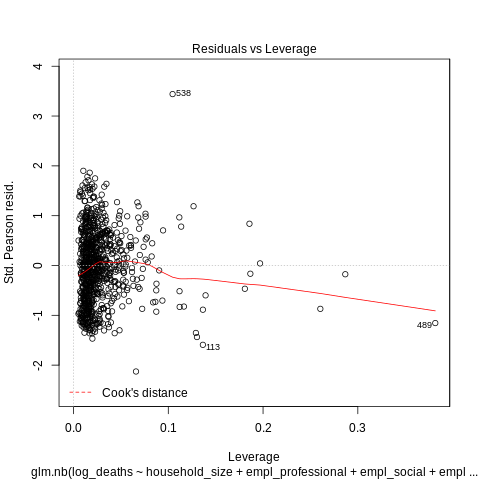

In [42]:
%%R -i abbrev

mod = glm.nb(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
             empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
             avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + 
             log_population + log_density + log_intl_passengers + log_domestic_passengers + 
             log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [43]:
log_formulas[3]

'log_deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_cases_march24 + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 1.059058 1.051713

Call:
glm.nb(formula = log_deaths ~ household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp + 
    log_cases_march24, data = abbrev, init.theta = 51960.82957, 
    link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.89037  -0.76782  -0.00455   0.46069   2.34012  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)              0.535100   0.028940  18.490  < 2e-16 ***
household_size           0.015711   0.033164   0.474  0.63569    
empl_professional       -0.054757   0.052265  -1.048  0.29478    
empl_social              0.011762   0.039653   0.297  0.76675

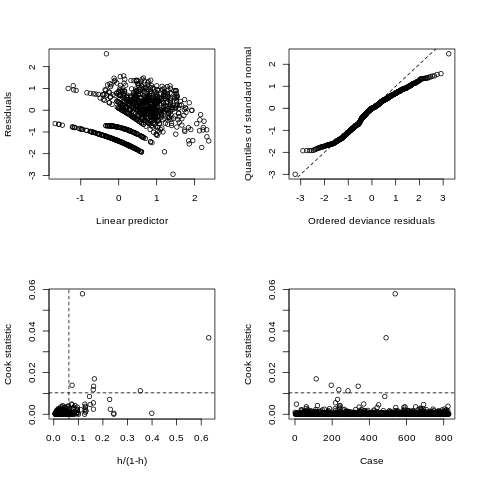

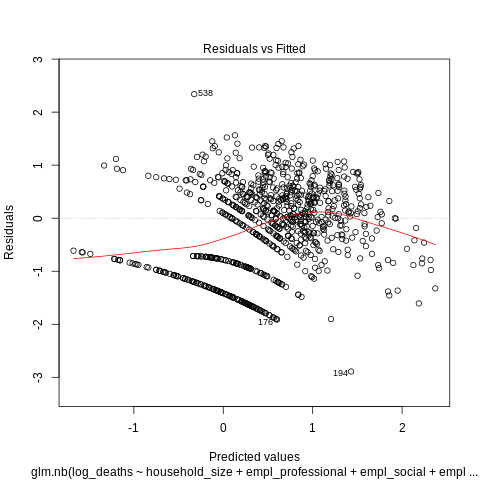

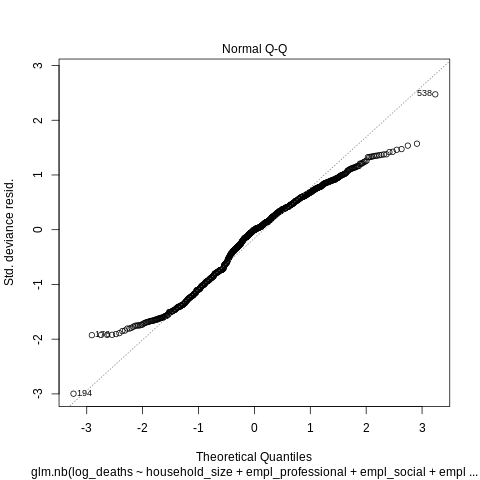

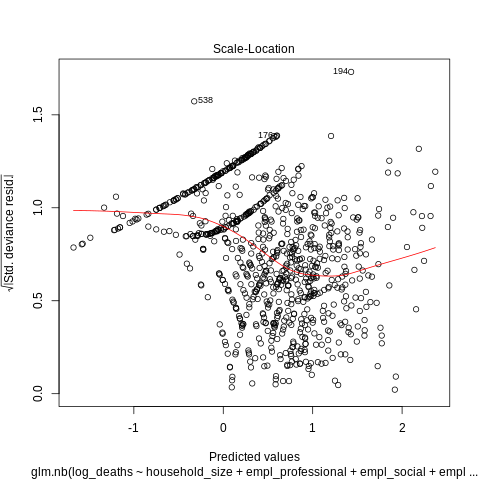

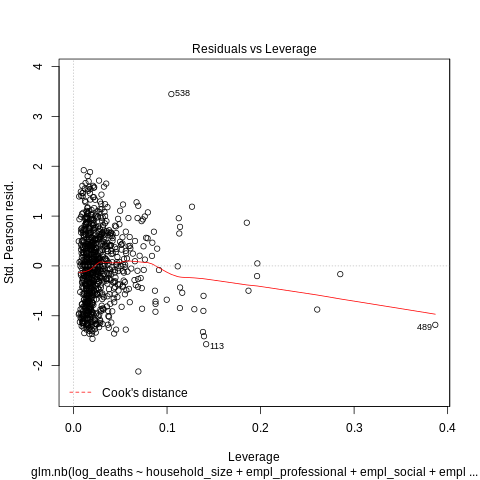

In [44]:
%%R 

mod = glm.nb(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
             empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
             avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + 
             log_population + log_density + log_intl_passengers + log_domestic_passengers + 
             log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp + 
             log_cases_march24, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

## Step Function using Negative Binomial Model

using log-transformed select predictors with no cases data, and log transformed response. selected based on adjusted cross-valiation estimate given (1.04, lower than other 3 negative binomial models tested) and lowest AIC (2404)

In [45]:
%%R

mod = glm.nb(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
             empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
             avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + 
             log_population + log_density + log_intl_passengers + log_domestic_passengers + 
             log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp, data = abbrev)

step = step(mod, direction="backward", scale=0)

Start:  AIC=2402.33
log_deaths ~ household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp

                          Df Deviance    AIC
- log_prc_public_transp    1   558.18 2400.4
- empl_retail              1   558.20 2400.4
- empl_social              1   558.20 2400.4
- empl_manufacturing       1   558.24 2400.4
- household_size           1   558.35 2400.6
- log_domestic_passengers  1   558.38 2400.6
- log_intl_passengers      1   558.40 2400.6
- empl_transp_utilities    1   558.44 2400.7
- uninsured                1   559.08 2401.3
- log_density              1   559.19 2401.4
- log_area                 1   559.25 2401.5
- log_population           1   55

In [46]:
%%R

summary(step)


Call:
glm.nb(formula = log_deaths ~ empl_services + pop_65_plus + prc_obese + 
    ten_plus + order + log_population + log_area, data = abbrev, 
    init.theta = 52067.80856, link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-3.00279  -0.77813  -0.01142   0.47807   1.97580  

Coefficients:
               Estimate Std. Error z value Pr(>|z|)    
(Intercept)     0.54063    0.02841  19.030  < 2e-16 ***
empl_services  -0.04820    0.02779  -1.735 0.082800 .  
pop_65_plus     0.06926    0.02632   2.632 0.008495 ** 
prc_obese       0.12942    0.02994   4.323 1.54e-05 ***
ten_plus        0.46403    0.04509  10.290  < 2e-16 ***
order           0.09831    0.02837   3.465 0.000529 ***
log_population  0.23151    0.03549   6.522 6.92e-11 ***
log_area       -0.09211    0.02324  -3.963 7.41e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for Negative Binomial(52067.81) family taken to be 1)

    Null deviance: 1225.

[1] 1.027904 1.026071

Call:
glm.nb(formula = log_deaths ~ empl_services + pop_65_plus + prc_obese + 
    ten_plus + order + log_population + log_area, data = abbrev, 
    init.theta = 52068.52001, link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-3.00279  -0.77813  -0.01142   0.47807   1.97580  

Coefficients:
               Estimate Std. Error z value Pr(>|z|)    
(Intercept)     0.54063    0.02841  19.030  < 2e-16 ***
empl_services  -0.04820    0.02779  -1.735 0.082800 .  
pop_65_plus     0.06926    0.02632   2.632 0.008495 ** 
prc_obese       0.12942    0.02994   4.323 1.54e-05 ***
ten_plus        0.46403    0.04509  10.290  < 2e-16 ***
order           0.09831    0.02837   3.465 0.000529 ***
log_population  0.23151    0.03549   6.522 6.92e-11 ***
log_area       -0.09211    0.02324  -3.963 7.41e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for Negative Binomial(52068.52) family taken to be 1)

  

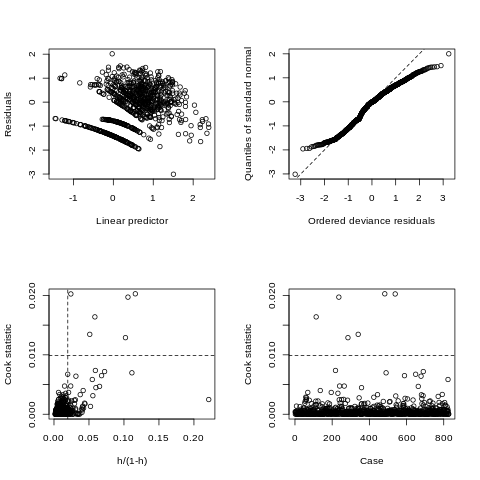

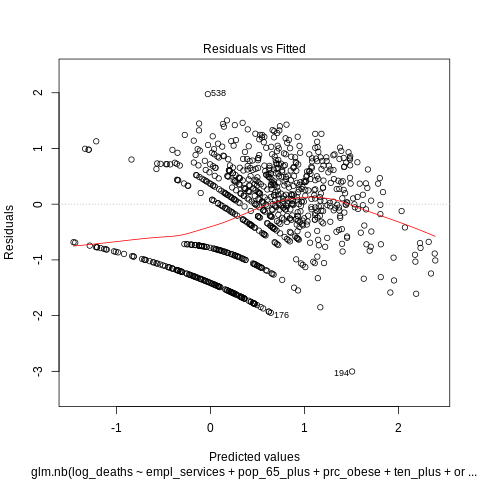

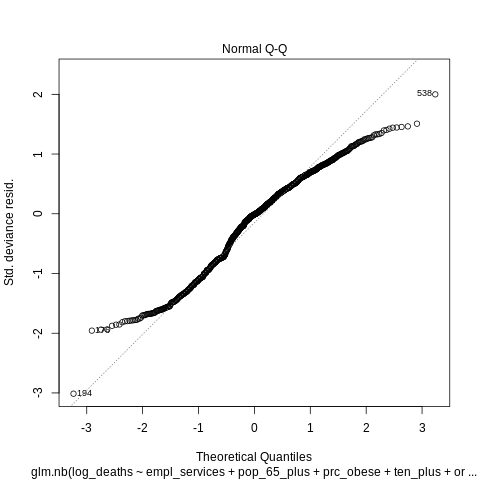

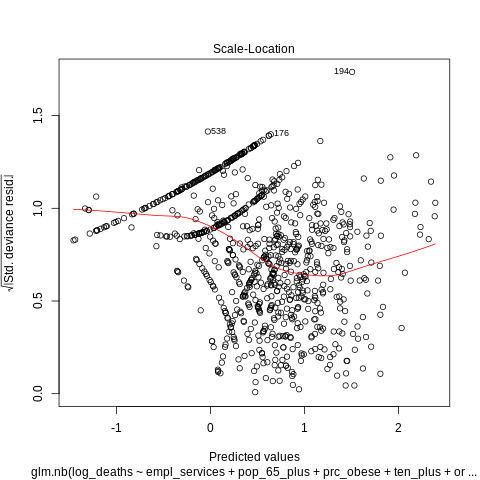

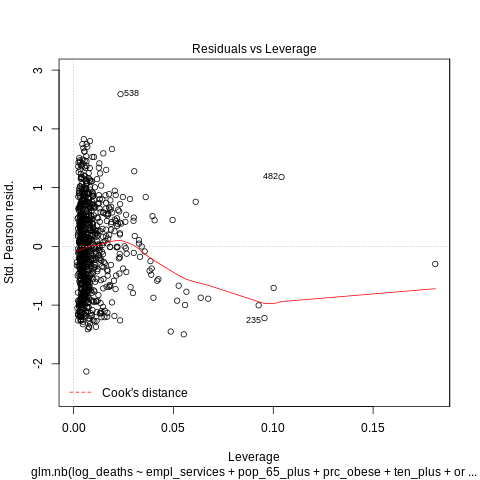

In [47]:
%%R

# create main effects model from step function output; get adjusted CV score

mod = glm.nb(formula = log_deaths ~ empl_services +  pop_65_plus + prc_obese + ten_plus + order + 
             log_population + log_area, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

## Negative Binomial Model with Interactions

In [48]:
formulas[0]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

[1] 3.570188e+51 3.211874e+51

Call:
glm.nb(formula = deaths ~ (household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density)^2, data = abbrev, 
    init.theta = 1.942544923, link = log)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-3.8840  -0.9450  -0.2583   0.4224   3.2503  

Coefficients: (1 not defined because of singularities)
                                            Estimate Std. Error z value
(Intercept)                                2.1245985  0.1812550  11.722
household_size                            -0.0902814  0.0935388  -0.965
empl_agriculture                          -0.8522136  0.2398102  -3.554
empl_professional                         -0.2345798  0

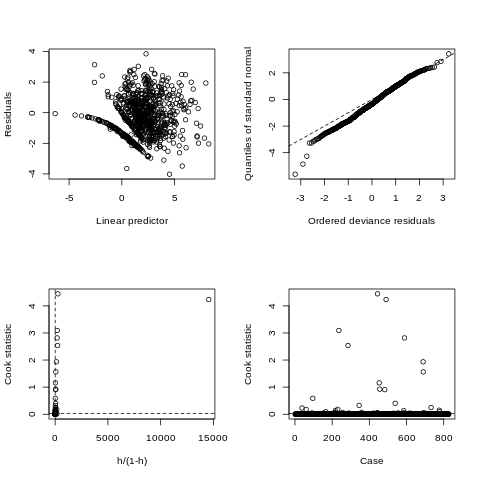

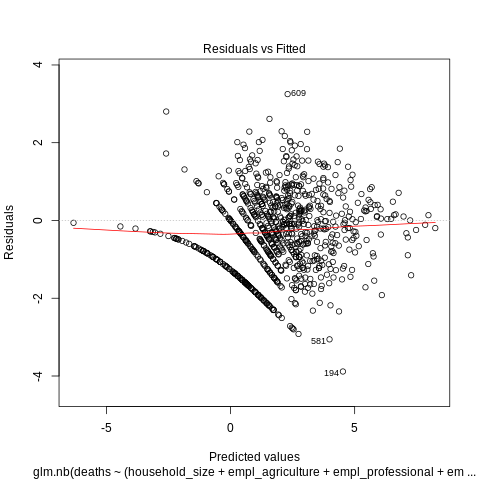

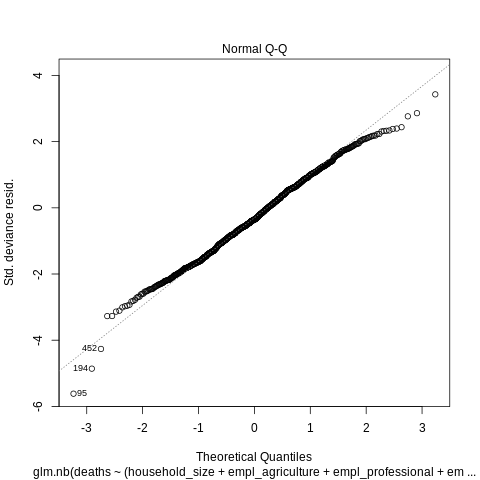

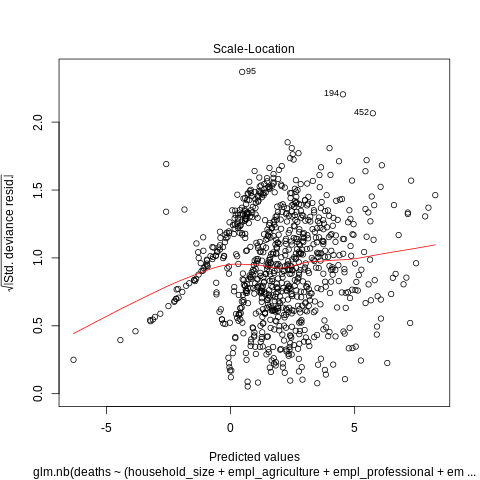

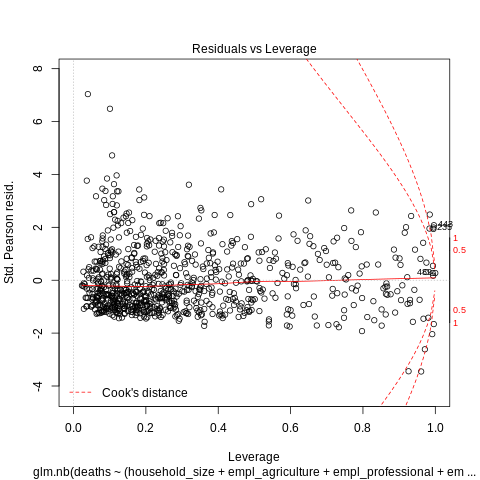

In [49]:
%%R 

mod = glm.nb(formula = deaths ~ (household_size + empl_agriculture + empl_professional + empl_social + 
             empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
             avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + 
             domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density)^2, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [50]:
formulas[1]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24'

[1] 8.474019e+188 7.623543e+188

Call:
glm.nb(formula = deaths ~ (household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density + cases_march24)^2, 
    data = abbrev, init.theta = 2.124716149, link = log)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-3.5874  -0.9494  -0.2332   0.4019   3.2194  

Coefficients: (1 not defined because of singularities)
                                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                                2.741606   0.300328   9.129  < 2e-16
household_size                            -0.143233   0.122310  -1.171  0.24157
empl_agriculture                          -0.455709   0.349478  -1.304  0.19224
empl_

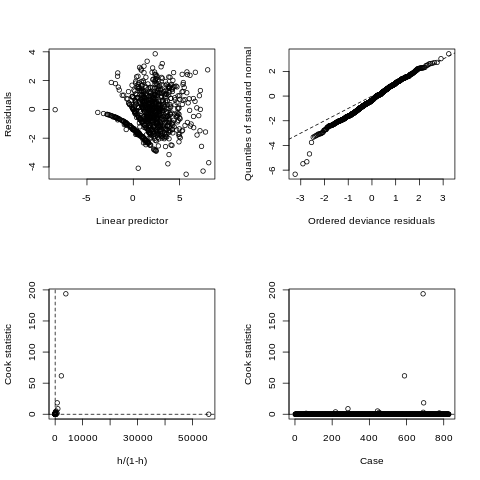

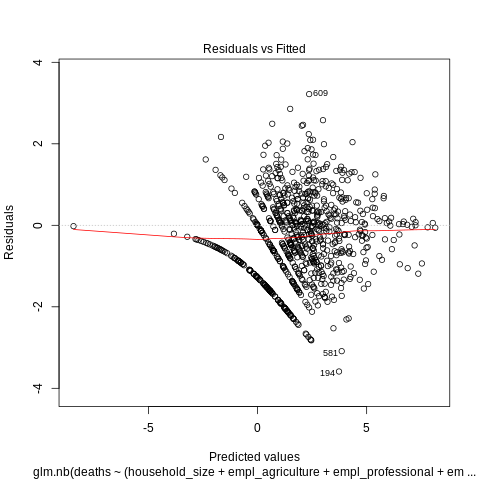

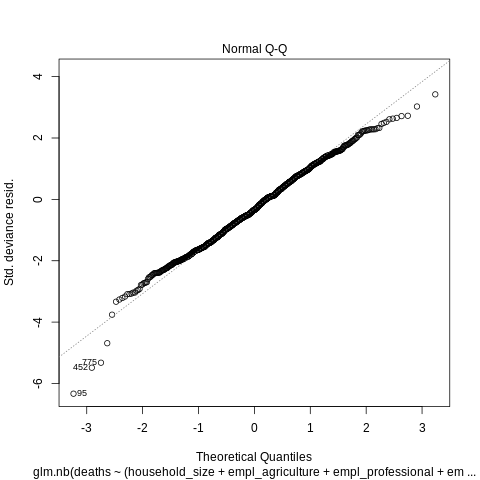

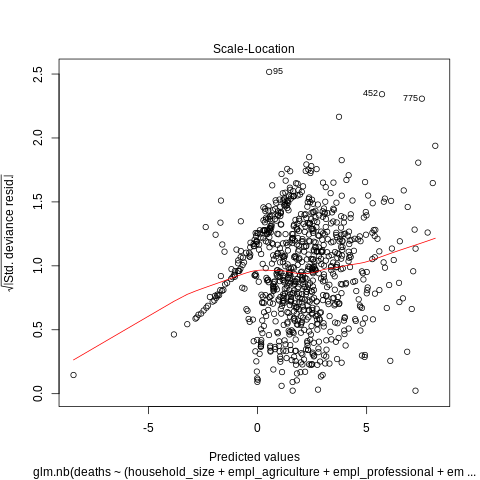

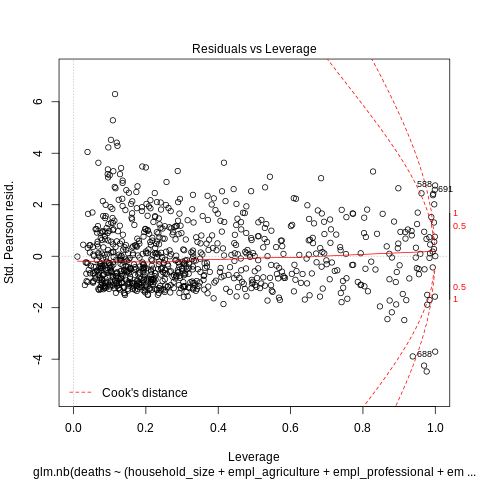

In [51]:
%%R 

mod = glm.nb(formula = deaths ~ (household_size + empl_agriculture + empl_professional + empl_social + 
             empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
             avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + 
             domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24)^2, 
             data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [52]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 183115.8 165160.6

Call:
glm.nb(formula = deaths ~ (household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp)^2, 
    data = abbrev, init.theta = 1.83616671, link = log)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-4.4530  -0.9842  -0.2775   0.4376   2.9172  

Coefficients:
                                               Estimate Std. Error z value
(Intercept)                                    2.287893   0.182193  12.558
household_size                                 0.012539   0.077444   0.162
empl_professional                             -0.184735   0.101199  -1.825
empl_social                                   -0.028343   0.082842  -0.3

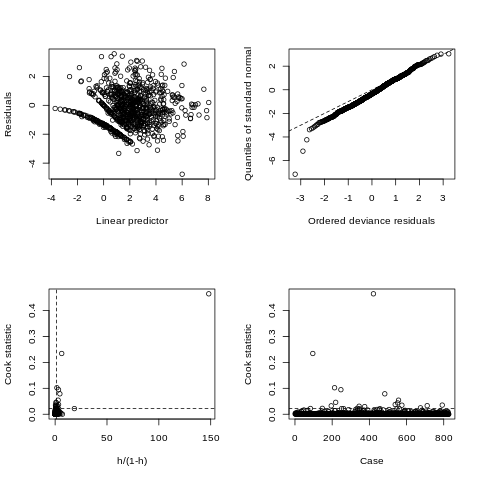

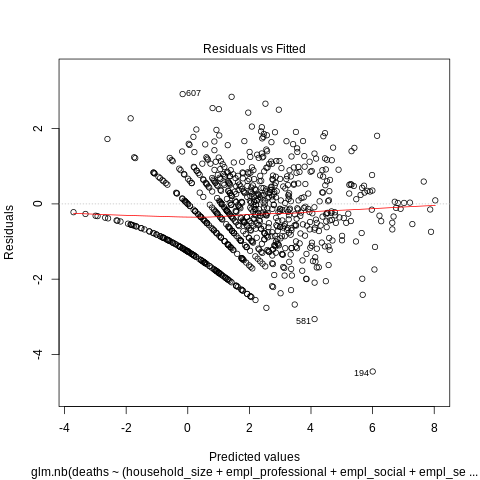

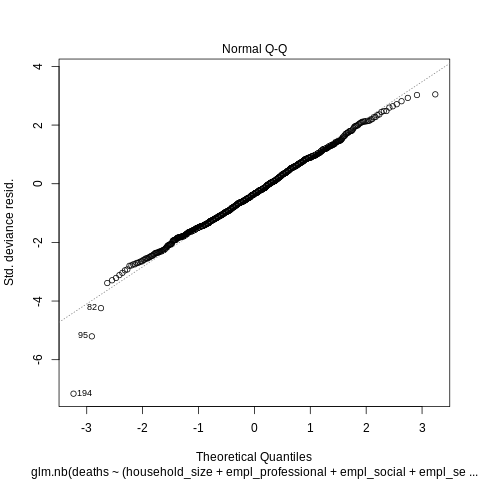

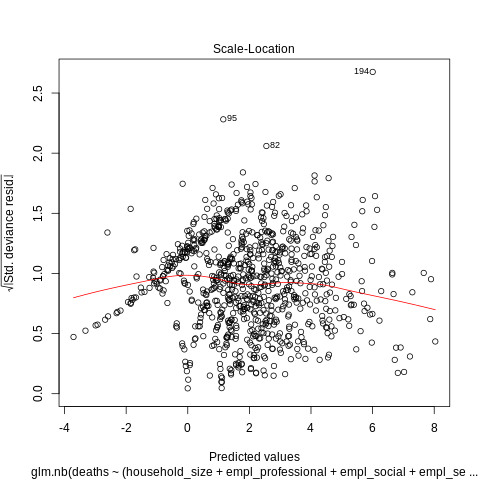

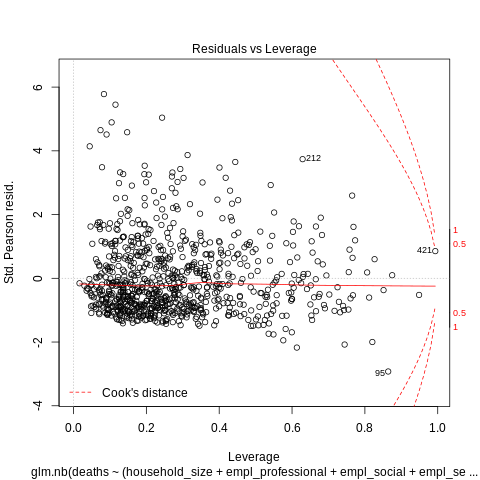

In [53]:
%%R 

# removed log_area because was giving "no valid set of coefficients found" error

mod = glm.nb(formula = deaths ~ (household_size + empl_professional + empl_social + empl_services + 
                                 empl_manufacturing + empl_retail + empl_transp_utilities + 
                                 prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + 
                                 ten_plus + order + log_population + log_density + log_intl_passengers + 
                                 log_domestic_passengers + log_incarcerated + log_empl_agriculture + 
                                 log_prc_public_transp)^2, 
             data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [54]:
formulas[3]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_cases_march24 + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 685694.4 617034.8

Call:
glm.nb(formula = deaths ~ (household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp + 
    log_cases_march24)^2, data = abbrev, init.theta = 2.06275868, 
    link = log)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-4.1616  -0.9759  -0.2589   0.4236   3.1622  

Coefficients:
                                                Estimate Std. Error z value
(Intercept)                                    2.1950803  0.1813310  12.105
household_size                                -0.0105983  0.0779388  -0.136
empl_professional                             -0.2123641  0.0994539  -2.135
empl_social                                

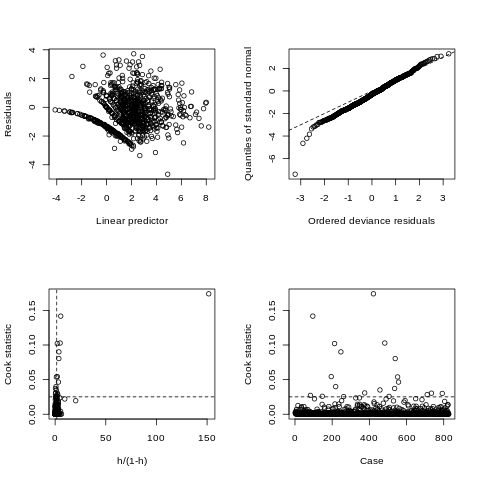

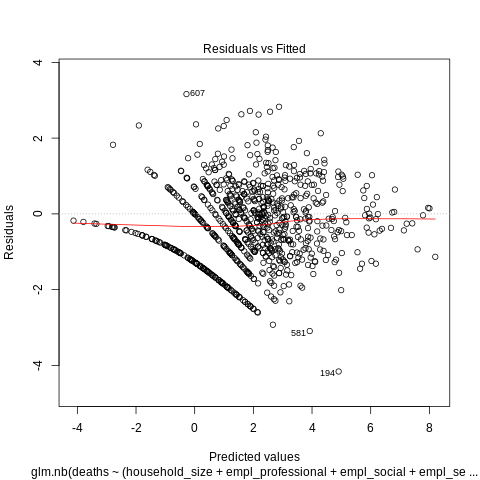

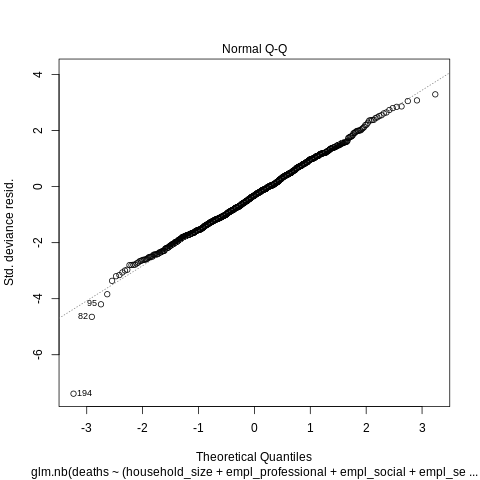

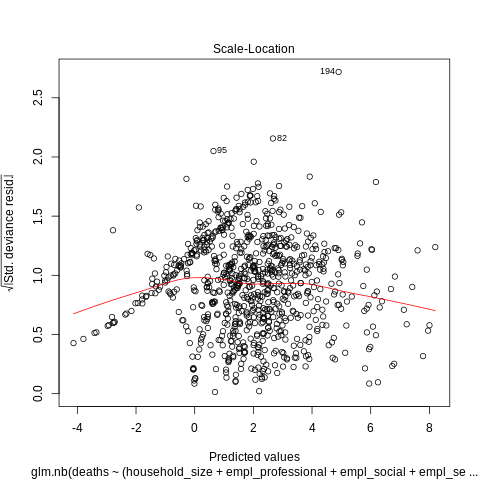

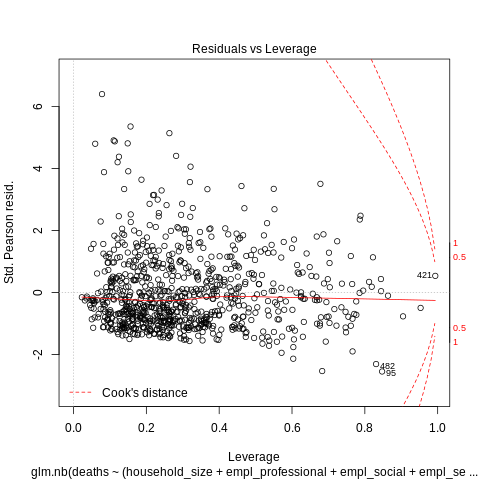

In [55]:
%%R 

# removed log_area because was giving "no valid set of coefficients found" error

mod = glm.nb(formula = deaths ~ (household_size + empl_professional + empl_social + empl_services + 
                                 empl_manufacturing + empl_retail + empl_transp_utilities + 
                                 prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + 
                                 ten_plus + order + log_population + log_density + log_intl_passengers + 
                                 log_domestic_passengers + log_incarcerated + log_empl_agriculture + 
                                 log_prc_public_transp + log_cases_march24)^2, 
             data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

### with transformed target

In [56]:
log_formulas[0]

'log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

[1] 2.189756e+15 1.969986e+15

Call:
glm.nb(formula = log_deaths ~ (household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density)^2, data = abbrev, 
    init.theta = 51628.6782, link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.56343  -0.65509  -0.02096   0.41842   1.64495  

Coefficients: (1 not defined because of singularities)
                                            Estimate Std. Error z value
(Intercept)                                0.5664578  0.1533700   3.693
household_size                            -0.0161077  0.0811233  -0.199
empl_agriculture                          -0.2790375  0.2035331  -1.371
empl_professional                         

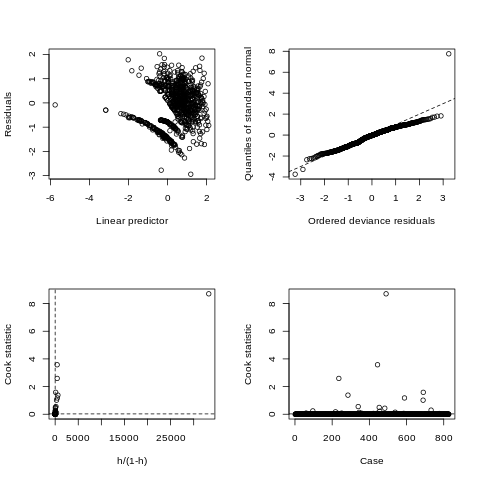

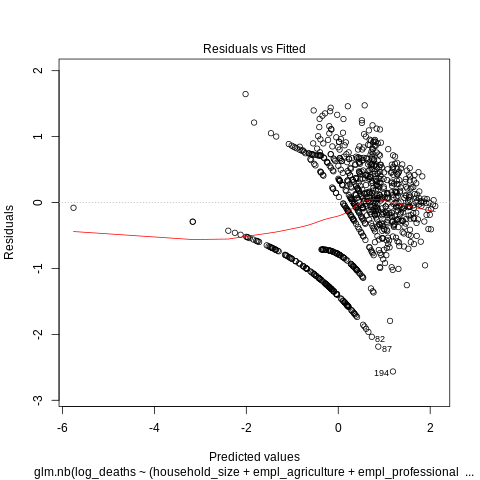

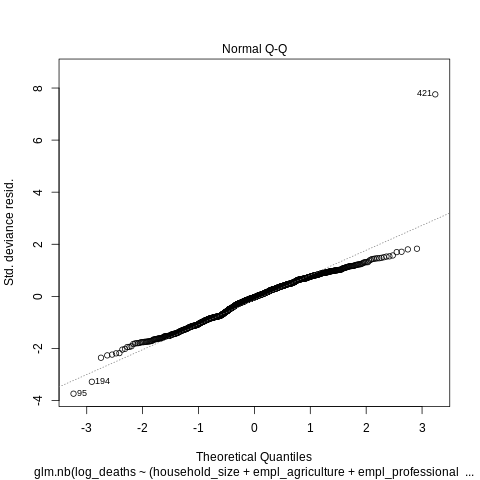

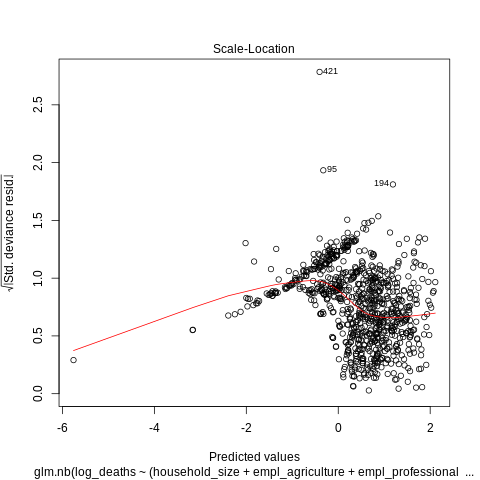

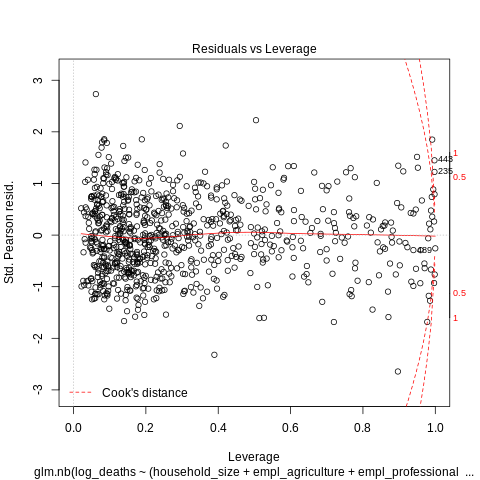

In [57]:
%%R 

mod = glm.nb(formula = log_deaths ~ (household_size + empl_agriculture + empl_professional + empl_social + 
             empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
             avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + 
             domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density)^2, data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [58]:
log_formulas[1]

'log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24'

[1] 7.756513e+41 6.978048e+41

Call:
glm.nb(formula = log_deaths ~ (household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density + cases_march24)^2, 
    data = abbrev, init.theta = 54429.40047, link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.31341  -0.61378  -0.01924   0.39356   1.54685  

Coefficients: (1 not defined because of singularities)
                                            Estimate Std. Error z value
(Intercept)                                6.177e-01  2.604e-01   2.372
household_size                            -6.380e-02  1.082e-01  -0.590
empl_agriculture                          -8.203e-02  3.070e-01  -0.267
empl_professional        

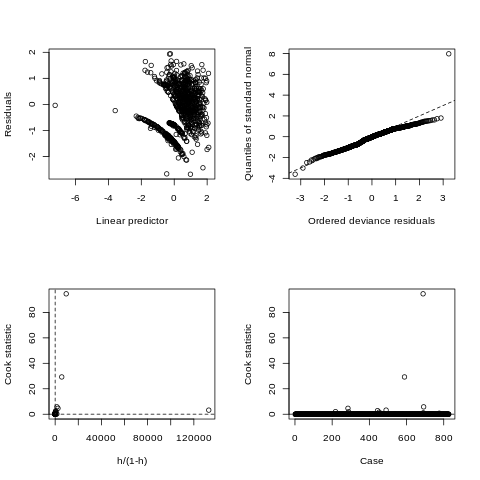

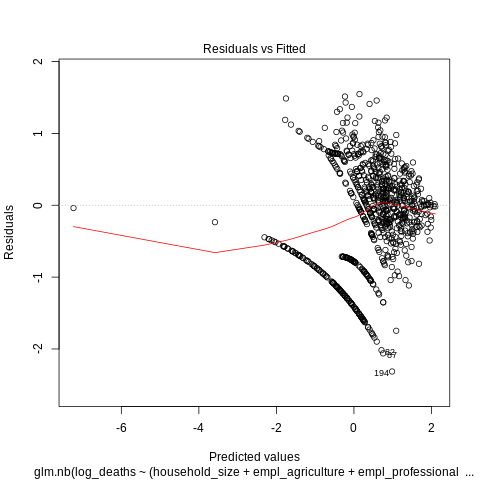

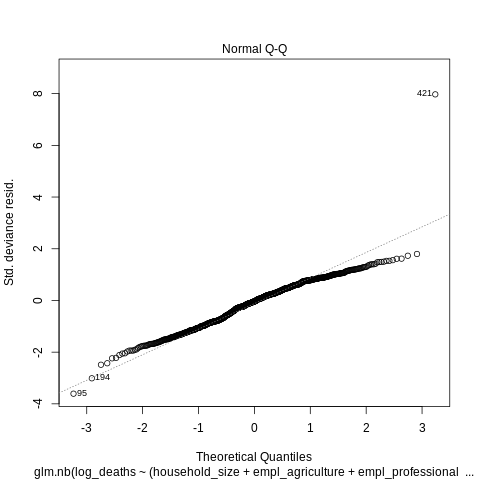

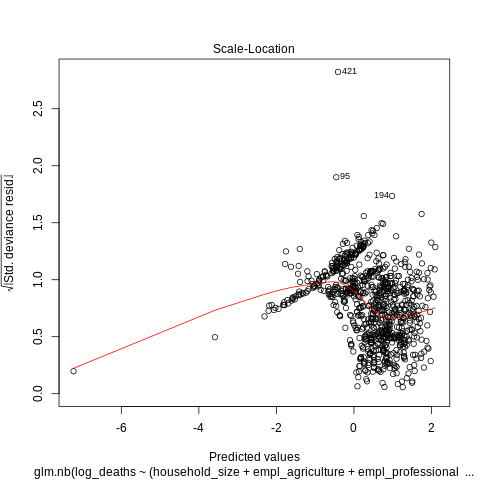

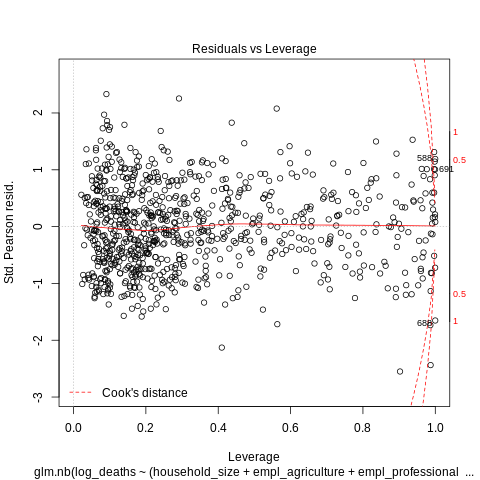

In [59]:
%%R 

mod = glm.nb(formula = log_deaths ~ (household_size + empl_agriculture + empl_professional + empl_social + 
             empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
             avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + 
             domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24)^2, 
             data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [60]:
log_formulas[2]

'log_deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 5.041506 4.612457

Call:
glm.nb(formula = log_deaths ~ (household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp)^2, 
    data = abbrev, init.theta = 46658.91607, link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.35747  -0.59417  -0.02955   0.40927   1.88692  

Coefficients:
                                                Estimate Std. Error z value
(Intercept)                                    0.5979115  0.1406281   4.252
household_size                                -0.0057861  0.0683537  -0.085
empl_professional                             -0.0758343  0.0887753  -0.854
empl_social                                   -0.0039

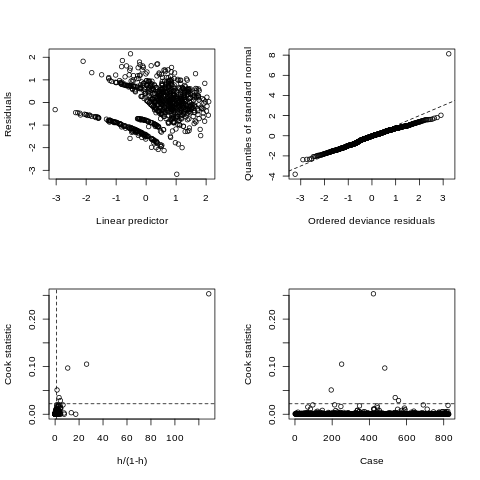

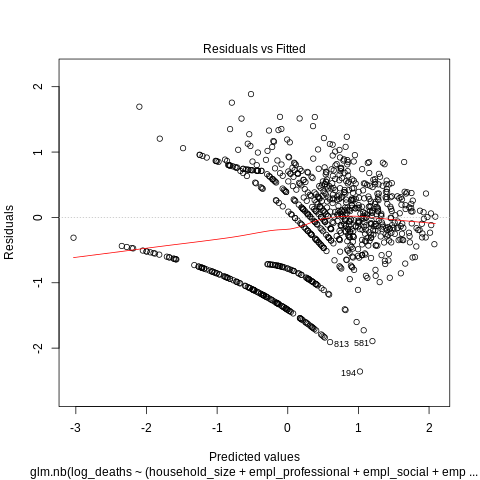

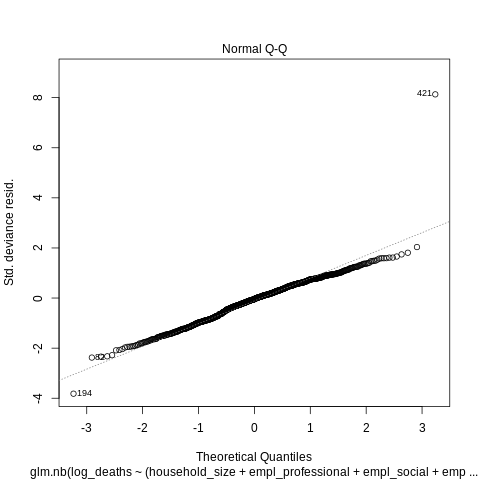

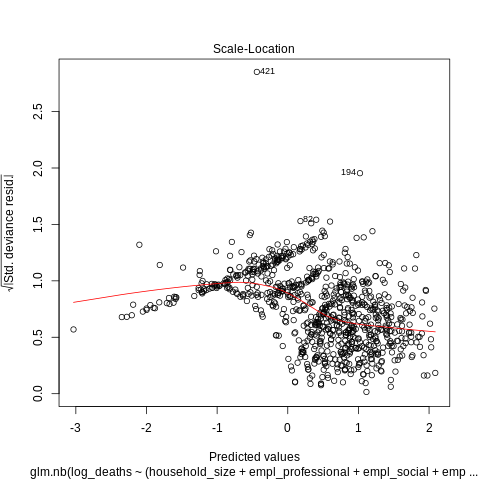

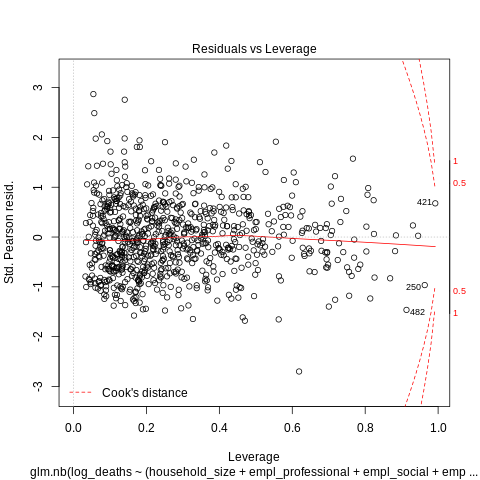

In [61]:
%%R 

# removed log_area because was giving "no valid set of coefficients found" error

mod = glm.nb(formula = log_deaths ~ (household_size + empl_professional + empl_social + empl_services + 
                                 empl_manufacturing + empl_retail + empl_transp_utilities + 
                                 prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + 
                                 ten_plus + order + log_population + log_density + log_intl_passengers + 
                                 log_domestic_passengers + log_incarcerated + log_empl_agriculture + 
                                 log_prc_public_transp)^2, 
             data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

In [62]:
log_formulas[3]

'log_deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_cases_march24 + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 16.48771 14.92149

Call:
glm.nb(formula = log_deaths ~ (household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp + 
    log_cases_march24)^2, data = abbrev, init.theta = 43369.49914, 
    link = log)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-1.95423  -0.52389  -0.03269   0.40689   1.83510  

Coefficients:
                                                Estimate Std. Error z value
(Intercept)                                    0.6287092  0.1470910   4.274
household_size                                -0.0179622  0.0718069  -0.250
empl_professional                             -0.0872865  0.0909833  -0.959
empl_social                 

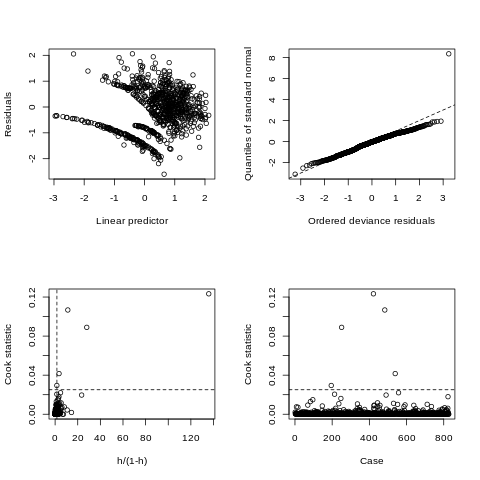

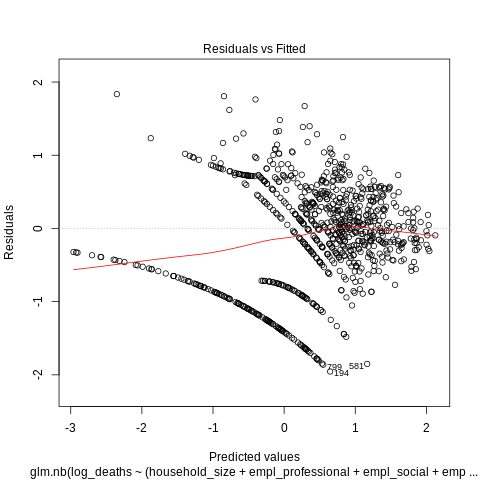

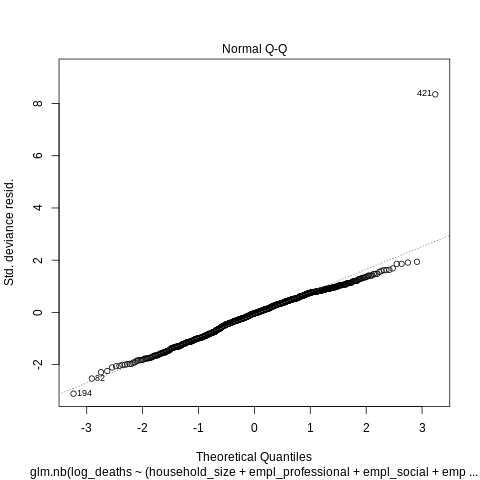

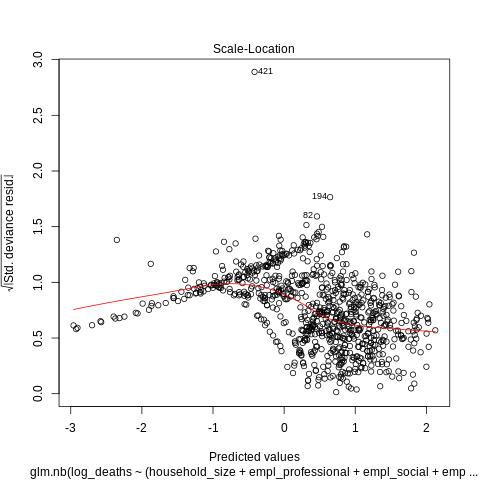

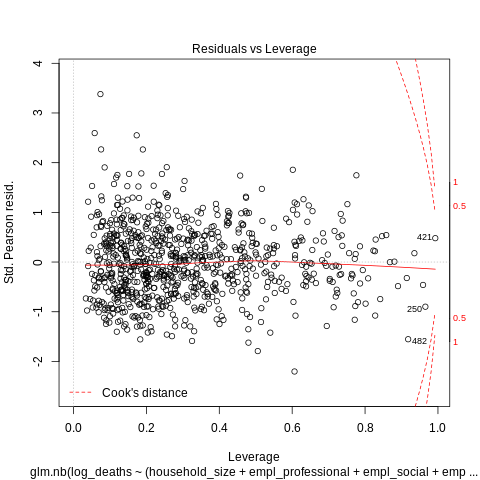

In [63]:
%%R 

# removed log_area because was giving "no valid set of coefficients found" error

mod = glm.nb(formula = log_deaths ~ (household_size + empl_professional + empl_social + empl_services + 
                                 empl_manufacturing + empl_retail + empl_transp_utilities + 
                                 prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + 
                                 ten_plus + order + log_population + log_density + log_intl_passengers + 
                                 log_domestic_passengers + log_incarcerated + log_empl_agriculture + 
                                 log_prc_public_transp + log_cases_march24)^2, 
             data = abbrev)

cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))

print(summary(mod))
plot(mod)

## Backwards Step from Neg. Binomial with Interactions

In [64]:
log_formulas[2] # selected from above given lowest AIC and adj. cv score

'log_deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

In [ ]:
%%R

# without log_area 
mod = glm.nb(formula = log_deaths ~ (household_size + empl_professional + empl_social + empl_services + 
             empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
             avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + 
             log_population + log_density + log_intl_passengers + log_domestic_passengers + 
             log_incarcerated + log_empl_agriculture + log_prc_public_transp)^2, data = abbrev)

step = step(mod, direction="backward", scale=0)

Start:  AIC=2679.52
log_deaths ~ (household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_incarcerated + 
    log_empl_agriculture + log_prc_public_transp)^2

                                                Df Deviance    AIC
- empl_social:pop_65_plus                        1   417.31 2677.5
- empl_professional:empl_social                  1   417.31 2677.5
- pop_65_plus:uninsured                          1   417.31 2677.5
- prc_obese:log_prc_public_transp                1   417.31 2677.5
- log_domestic_passengers:log_empl_agriculture   1   417.31 2677.5
- empl_professional:log_population               1   417.31 2677.5
- avg_income:log_domestic_passengers             1   417.31 2677.5
- uninsured:order                           

In [66]:
abbrev.to_csv("for_model.csv")